# Fault development (WT02)

The notebook contains fault development analysis using vibration data from WT04. The analysis is mostly done using unsupervised machine learning techniques.

In [1]:
#### Looking at the following intervals in the traditional analysis:
intervals_wt01 = [3, 98, 204, 301, 407]
intervals_wt02 = [7, 101, 213, 293, 413]
intervals_wt03 = [1, 102, 199, 301, 411]
intervals_wt04 = [4, 102, 198, 306, 423]

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys, os,os.path
from scipy import stats
import glob # To count files in folder
import os.path
import progressbar
from tqdm.notebook import tqdm
from math import pi
from numpy.fft import rfftfreq, rfft
from scipy.fftpack import next_fast_len
from scipy.signal import spectrogram
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from IPython.display import Markdown

ROOT_PATH = os.path.abspath("..").split("data_processing")[0]
module_paths = []
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/data_processing/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/hybrid_analysis_process_functions/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/utils/")))
for module_path in module_paths:
    if module_path not in sys.path:
        print("appended")
        sys.path.append(module_path)

import functions as f
import wt_data, ff_transform, explore_fft_time_data, envelope, build_dataset,\
load_raw_signals, envelope, envelope_emd,plotting_methods,\
resample_signals, filter_signals, plotting_methods,filters,correlation_coeff,\
clustering,feature_extraction,polycoherence,plot_eemd,correlation_plot


appended
appended
appended
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
/Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src


In [4]:
c, p = f.color_palette()
sns.set(context='paper', style='whitegrid', palette=np.array(p))
plt.style.use(ROOT_PATH+"/utils/plotparams.rc")

In [4]:
vib_signal, times, op_data_intervals, _ = load_raw_signals.load_raw('gearbox','wt02')

File exist


In [12]:
vib_signal.shape

(419, 262144)

In [4]:
# SLOW: Find out which indexes to remove:
remove_these = build_dataset.find_indexes_to_remove('WTG02')


Loading WTG02...
Loaded WTG02


In [5]:
wt_num=2
df_times_unfiltered = pd.read_csv(f'/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt02/interval_dates_wt0{wt_num}.csv')


In [8]:
display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">Index 350 corresponds to {df_times_unfiltered.iloc[350].Date}:</span>'))

<span style="color: #2a9d8f; font-size: 20px">Index 350 corresponds to 2019-08-18 04:21:01:</span>

In [9]:
df_times = pd.read_csv('/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt02/interval_dates_wt02.csv')

In [10]:
# Removing the indexes that weren't in the other op dataset.
if(op_data_intervals.shape[0] != df_times.shape[0]):
    print('removing')
    remove_these=np.flip(remove_these)
    for index in remove_these:
        df_times = df_times.drop([df_times.index[index]])
df_times.shape
df_times = df_times.reset_index(drop=True)

try: 
    # df_times = df_times.drop(['index','Unnamed: 0'],axis=1)
    df_times = df_times.drop(['level_0'],axis=1)
except: 
    print('Could not remove')

removing
Could not remove


Adding dates to a new df.

In [11]:
dates=pd.DataFrame(df_times['Date'],columns=['Date'])

formatted_dates = []

for d in dates['Date']:
    formatted_dates.append((d.split(' ')[0][:7]))
new_df=op_data_intervals
new_df['Date'] = formatted_dates

In [12]:
# The df times which is cleaned.
df_times

,Unnamed: 0,Date
0,0,2018-08-04 18:56:41
1,0,2018-08-04 20:26:11
2,0,2018-08-05 12:38:53
3,0,2018-08-11 13:34:30
4,0,2018-08-13 10:19:08
...,...,...
414,0,2019-10-26 02:55:20
415,0,2019-10-27 11:24:05
416,0,2019-10-28 07:13:25
417,0,2019-10-29 02:54:44


In [13]:
op_data_intervals.shape[0]

419

In [ ]:
p1=sns.color_palette("RdBu", n_colors=8)[2:-2]
p2=sns.color_palette("RdBu_r", n_colors=7)
p3=sns.color_palette("RdBu", n_colors=5)[1:-3]
new_palette=p1+p2+p3[0:-1]+[p2[5]]+[p1[0]]+[p1[1]]+[p1[2]]
sns.palplot(new_palette)
print("aug       sept     okt     nov    des     jan     feb     mars   april   mai    juni   juli   august  sept    octo")

In [ ]:
number_of_boxplots = len(result.groupby('Date').nunique())
number_of_boxplots

In [ ]:
import datetime
input1 = '23/12/2011'
my_date = datetime.datetime.strptime(input1, "%d/%m/%Y")
print(my_date.strftime("%d %b, %Y")) # 23 Dec, 2011



In [14]:
# Hardcode some seasonal colours

def plot_season_groups(df,features_to_plot,wtnum):
    
    df['Month'] = df['Date']

    '''p1=sns.color_palette("RdBu", n_colors=6)
    p2=sns.color_palette("RdBu_r", n_colors=7)
    p3=sns.color_palette("RdBu", n_colors=6)[1:-1]
    new_palette=p1[0:-2]+p2+p3'''
    
    # Season colors
    p1=sns.color_palette("RdBu", n_colors=8)[2:-2]
    p2=sns.color_palette("RdBu_r", n_colors=7)
    p3=sns.color_palette("RdBu", n_colors=5)[1:-3]
    new_palette=p1+p2+p3[0:-1]+[p2[5]]+[p1[0]]+[p1[1]]+[p1[2]]
    
    number_of_boxplots = len(result.groupby('Date').nunique())
            
    for i in range(len(features_to_plot)):
        feat = features_to_plot[i]
    
        # formatting title
        if (len(feat.split('_'))>2):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1])+ '\_' + str(feat.split('_')[2]))
        elif (len(feat.split('_'))>1):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1]))
        else:
            feat_name=feat
        fig = plt.figure(figsize=(15, 5))
        plot=sns.violinplot(data=df, x='Month', y=features_to_plot[i], palette=new_palette)
        
        # Calculate number of obs per group & median to position observation number
        medians = df.groupby('Date')[feat].median().values
        nobs = df['Date'].value_counts().values # number of observations for feature
        nobs = [int(x) for x in nobs.tolist()]
        # nobs = ["n: " + i for i in nobs]
        #nobs = ["N = " + i for i in nobs]
        print(nobs)
        # Add it to the plot
        pos = range(len(nobs))
        
        
        labels=plot.get_xticklabels()

        nobs = [f"N = {nobs[i]}\n {labels[i].get_text()}" for i in pos]

        plot.set_xticklabels(nobs)
        
        #for tick,label in zip(pos,plot.get_xticklabels()):
            #print(label)
            #plot.text(pos[tick], medians[tick] + 0.03, nobs[tick], horizontalalignment='center', size='large', color='black', weight='semibold')


        
        # plot = sns.swarmplot(data=df, x='Month', y=features_to_plot[i], color=".25")
        plt.xticks(rotation=45)
        plt.style.use(ROOT_PATH+"/utils/plotparams.rc")
        plt.title(f"WT0{wtnum}: Grouping "+ r"$\bf{"+str(feat_name)+"}$" +" by month")
        # plt.ylabel(ylabels[i])
        plt.xlabel('Month and number of samples (N)')
        
        '''

        if features_to_plot[i]=='WindSpeed':
            plt.ylim(3,30)

        if features_to_plot[i]=='AvgSpeed':
            plt.ylim(600,1650)

        if features_to_plot[i]=='AvgPower':
            plt.ylim(300,4000)
        '''
        plt.tight_layout()

        # Saving
        save_path=f'../../plots/features/'
        plt.savefig(f'{save_path}/grouped_by_month/{wtnum}_{features_to_plot[i]}.png',dpi=300)

        plt.show()

        
# features_to_plot = ['AvgPower', 'WindSpeed', 'AvgSpeed']        
# plot_season_groups(new_df,features_to_plot,4)

### EEMD and Bi-spectrum inspection

In [ ]:
raw_imfs_path='/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt02/eemds_wt02/'
file_count = len(glob.glob1(raw_imfs_path,"*.zip"))
print(file_count)

## Plotting an EEMD:

In [ ]:
new_row = [{'name':1, 'physics':87, 'chemistry':92, 'algebra':97}]
new_row2 = [{'name':1, 'physics':87, 'chemistry':92, 'algebra':97}]
df1=pd.DataFrame(new_row)
df2=pd.DataFrame(new_row2)

pd.concat([df1,df2])

In [ ]:
a=np.array(vib_signal[1][0:20000])
envelope_emd.eemd('WT02',1,'HSS Gearbox', a,times[1][0:20000])

In [ ]:

intervals = [4, 102, 198, 306, 423]
# fig1, axs = plt.subplots(2,2, figsize=(15, 20), facecolor='w', edgecolor='k')
#axs=axs.flatten()
for i,interval_num in enumerate(intervals):
    # reading form file
    imf_df=pd.read_csv(raw_imfs_path+f'raw_wt02_interval_number_{interval_num}.zip')
    timestamp_of_signal=df_times[df_times.index==interval_num]['Date'][interval_num]

    # plot_eemd.plot_imfs_and_kurtosis(raw_imfs_path,'eemd_wt04_interval_400',times,'zip',plot_num_intervals)
    plot_eemd.plot_n_imfs_and_kurtosis(1,imf_df,interval_num,timestamp_of_signal,f'eemd_wt02_interval_{interval_num}',times,'zip',number_to_print=6)
    #axs[i].


## Bi-spectrum

In [ ]:
print(f'The duration of the signal which bi-spectrum features are extracted \
from is {times[0][3000]}')

### Plotting one bi-spectrum with raw signal
This is plotted for comparison with the other wind turbines. This is based on the unfiltered signal.

In [ ]:


sig=vib_signal[0][0:3000]
fs = 25600

N=10000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part
polycoherence.plot_polycoherence(freq1, fre2, bispec_half)

plt.show()


sig=vib_signal[400][0:3000]
fs = 25600

N=10000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part
polycoherence.plot_polycoherence(freq1, fre2, bispec_half)

plt.show()


### Loading the HP signals (6000 Hz)
We need this signal for early fault detection, where the literature states that faulty characteristics first show up in the higher frequencies.

In [4]:
def load_6000_filtered(filtered_path):
    num_csvs = len([f for f in os.listdir(filtered_path) 
         if f.endswith('.csv') and os.path.isfile(os.path.join(filtered_path, f)) and f[0]=='f'])

    filtered_signals = []
    filtered_freqs = []
    columns = []
    for i in tqdm(range(num_csvs)):
        acc=pd.read_csv(filtered_path+'filtered_raw_6000_'+str(i)+'.csv')
        columns.append('filtered_' + str(i))
        filtered_signals.append(acc.values.T[0])
        filtered_freqs.append(acc.shape[0] / times[i][-1])
        print(f'Reading {i} / {num_csvs} files', end='\r')

    filtered_signals = np.asarray(filtered_signals)
    filtered_signals
    return filtered_signals

filtered_path = '/Volumes/OsvikExtra/signal_data/raw_filtered_6000Hz/gearbox/wt02/filtered/'
filtered_signals=load_6000_filtered(filtered_path)

Reading 418 / 419 files


### Plotting bi-spectrum for one interval (HP 6000 Hz filtered)
Since we are looking at the higher frequency bands, we want to use bi-spectrum features from these.

In [ ]:

def plot_bispec(wt_num,interval_num):
    fs=25600
    sig=filtered_signals[interval_num][0:3000] # selecting to be stationary

    N=20000 # Select the N to split the signal into N parts
    kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
    freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
    # polycoherence.plot_polycoherence(freq1, fre2, bispec)
    # plt.show()
    # print(bispec.shape)

    bispec_half = np.triu(bispec) # remove symmetric part

    polycoherence.plot_polycoherence(freq1, fre2, bispec_half)
    var = df_times.iloc[interval_num]['Date']
    plt.title(f'WT0{wt_num}: Bispectrum plot HP filtered signal (interval {interval_num}).\n Date: {var}')
    SAVE_FILE_NAME = f'WT04_bispectrum_interval_{interval_num}'
    plt.savefig(f'../../plots/bispectrums/{SAVE_FILE_NAME}.png',dpi=200)
    plt.tight_layout()
    plt.show()
    
    
plot_interval1 = intervals_wt04[0]
plot_interval2 = intervals_wt04[-1]
    
plot_bispec(4,plot_interval1)

plot_bispec(4,plot_interval1)
plot_bispec(4,3)
plot_bispec(4,plot_interval2)

# Features

### Creating/Loading feature_df
Time domain: Statistical features
Frequency domain: Bi-spectrum features
Time-frequency domain: 5 first IMF features

In [5]:
wt_num=2
feature_df=feature_extraction.generate_feature_df(wt_num,25600,op_data_intervals,filtered_signals)


All features already exist. They are returned.


In [ ]:
feature_df

In [ ]:
feature_df[feature_df['WindSpeed']<0]

Removing fetures `['Unnamed: 0','NacelleDirection','entropy']` from `features_cleaned`

In [9]:
try:
    features_cleaned = feature_df.drop(['Unnamed: 0','NacelleDirection','entropy'],axis=1)
except:
    features_cleaned = feature_df.drop(['NacelleDirection','entropy'],axis=1)
features_cleaned.Date

0      2018-08
1      2018-08
2      2018-08
3      2018-08
4      2018-08
        ...   
265    2019-10
266    2019-10
267    2019-10
268    2019-10
269    2019-10
Name: Date, Length: 270, dtype: object

Boxplot of `features_cleaned`, just filtered on RPM 1450.

--- 7.93496298789978 seconds ---


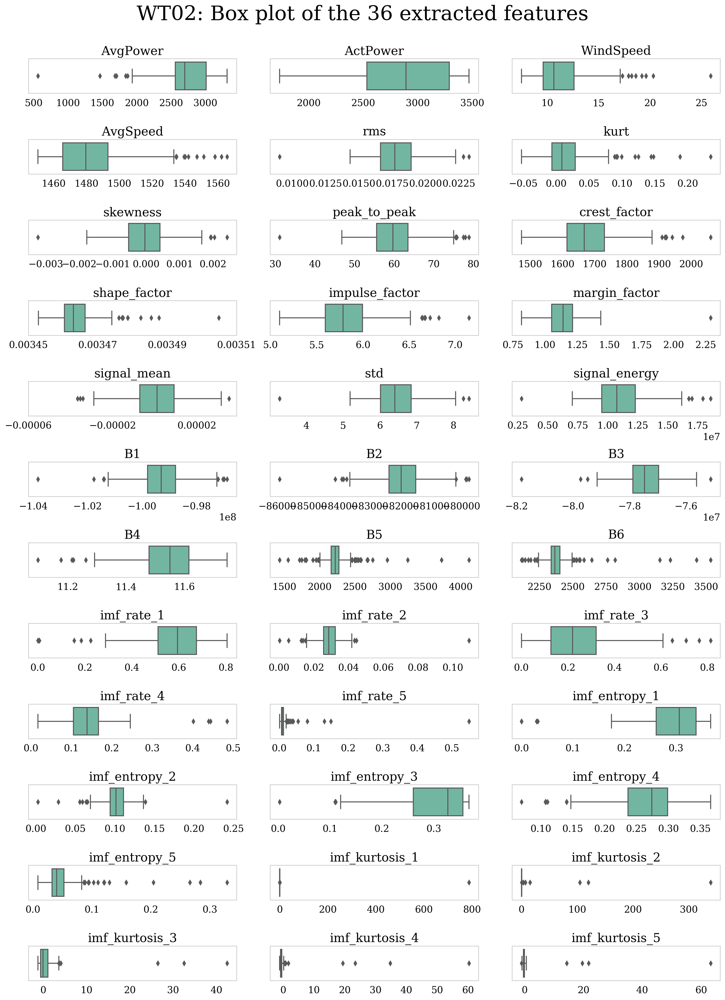

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as plticker


#first_half_features = features_cleaned.columns[:len(features_cleaned.columns)//2]
#second_half_features = features_cleaned.columns[len(features_cleaned.columns)//2:]

#subsets=[first_half_features,second_half_features]

import time
start_time = time.time()

fig,axs = plt.subplots(9,4,figsize=(15,23))

fig.suptitle(f"WT0{str(wt_num)}: Box plot of the 36 extracted features",fontsize=30)

fig.tight_layout()
# plt.subplots_adjust(top=0.96)

i=1
for column in features_cleaned:
    if (column == 'Index' or column== 'Date'):
        continue

    ax = fig.add_subplot(13,3,i)
    ax.set_title(column,fontsize=18)
    sns.boxplot(features_cleaned[column],palette="Set2")
    ax.set_xlabel('')
    ax.grid(False)

    if (column == 'shape_factor' or column=='signal_mean'):
        #loc = plticker.MultipleLocator(base=5) # this locator puts ticks at regular intervals
        #ax.xaxis.set_major_locator(loc)
        ax.set_xticks(ax.get_xticks()[::2])


    # Removing y ticks and y labels
    frame1 = plt.gca()
    frame1.axes.yaxis.set_ticklabels([])
    frame1.axes.get_yaxis().set_ticks([])

    for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize(14) 

    i+=1

# Remove the empty plots
flat = axs.flatten()
for a in flat:
    fig.delaxes(a)



# fig.subplots_adjust(hspace=0.9)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
print("--- %s seconds ---" % (time.time() - start_time))

fig.savefig(f"../../plots/box_plots/boxplot_WT0{str(wt_num)}.eps",format='eps',bbox_inches='tight')

plt.show()


Creating some latex tables of `features_cleaned`

In [21]:
def df_to_latex(dataframe,index=True):
    text =  dataframe.to_latex(index=index)
    return text

def head_row_col(dataframe):
    print_df = dataframe.head().iloc[:,[1,2,3,4,5]].copy()
    print_df["..."]="..."
    return print_df

In [ ]:
text1 = df_to_latex(feature_df[['AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed']].head().round(2))
print(text1)
print('##########')

dftime=head_row_col(feature_df[['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy']].head().round(4))

text2 = df_to_latex(dftime)
print(text2)

In [ ]:
i = 11
j = 1
a = np.zeros(shape=(i,j))
print(a.shape)
a=a.T
df = pd.DataFrame(data=a,columns=['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy'])
print(df_to_latex(df))


### Removing some noisy points in the ```imf_kurtosis_X``` and ```WindSpeed``` features
But first, removing some noisy data.

In [10]:
# Need to clean away these crazy points
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_2']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_3']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_4']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_5']>5]['Index']))

# filtering away some noisy points:
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_1']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_2']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_3']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_4']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_5']<5]


try:
    features_cleaned=features_cleaned.drop(['cluster_assigned'],axis=1)
except:
    print("Could not remove cluster_assigned")

print(feature_df.shape)
print(features_cleaned.shape)


# Remove netgative wind speed

features_cleaned = features_cleaned[features_cleaned['WindSpeed'] > 0]
print(features_cleaned.shape)


features_cleaned=features_cleaned.reset_index(drop=True)

[ 74  92 169 192 291]
[ 92 169 291]
[ 92 169 230 291]
[ 92 169 230 291]
Could not remove cluster_assigned
(270, 41)
(264, 38)
(264, 38)


### Plotting features one by one

In [ ]:
# PLOT EACH COLUMN HERE:
def save_feature_figs(feature):
    for feat in features_cleaned.columns:
        
        if (len(feat.split('_'))>2):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1])+ '\_' + str(feat.split('_')[2]))
        elif (len(feat.split('_'))>1):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1]))
        else:
            feat_name=feat
        ax = features_cleaned[feat].plot(style='.-',title="WT04:\n Feature: " + r"$\bf{"+str(feat_name)+"}$",figsize=(15,3))
        ax.set_xlabel('Interval index (Time)')
        ax.set_ylabel('Feature value')
        
        plt.xlim(0,features_cleaned.shape[0])
        save_path=f'../../plots/features/{feature}'
        if (not os.path.exists(save_path)):
            try:
                os.mkdir(save_path)
            
            except OSError:
                print("Not able to create folder")

        # path exists now
        plt.tight_layout()
        plt.savefig(f'{save_path}/{feat}_and_{feature}.png',dpi=300)
        plt.show()

save_feature_figs('wt04_features_plotted_time')

In [11]:
# save dataframe to file
features_cleaned.to_csv('dataset_wt_2.csv')

Grouping `features_removed` by month and plotting  each feature to look for patterns

In [23]:
try:
    dt_times=df_times.drop(['Unnamed: 0'],axis=1)
except:
    print('Not removed')
    dt_times = df_times

In [26]:
formatted_dates = []

for d in dt_times['Date']:
    # df_times.append((d.split(' ')[0][:7]))
    formatted_dates.append((d.split(' ')[0][:7]))
    
new_times_df= pd.DataFrame(formatted_dates,columns=['Date'])
new_times_df['Index'] = new_times_df.index
# new_times_df=new_times_df.drop([0],axis=1) # removing a weird column

new_times_df['Index'] = new_times_df.index

Adding the month column to the features cleaned df and plotting the boxplots.

Note here that the features are cleaned!!

In [ ]:
features_cleaned.drop(['Date'],axis=1,inplace=True)

In [28]:
wtnum = 2

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


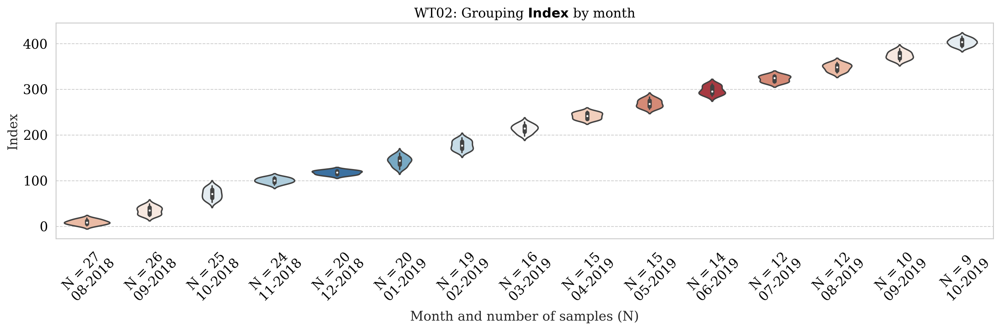

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


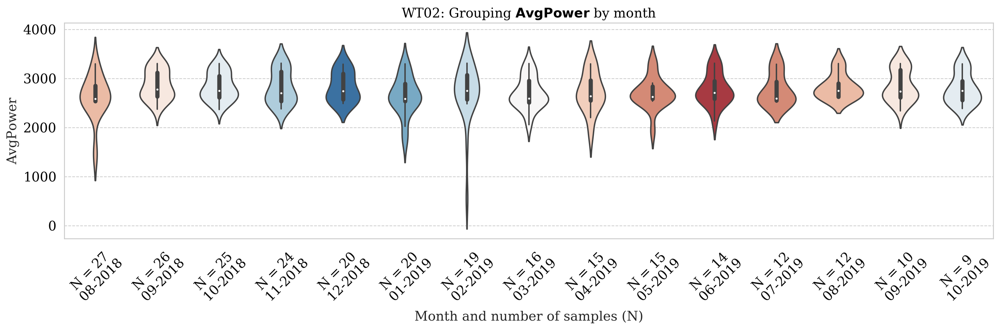

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


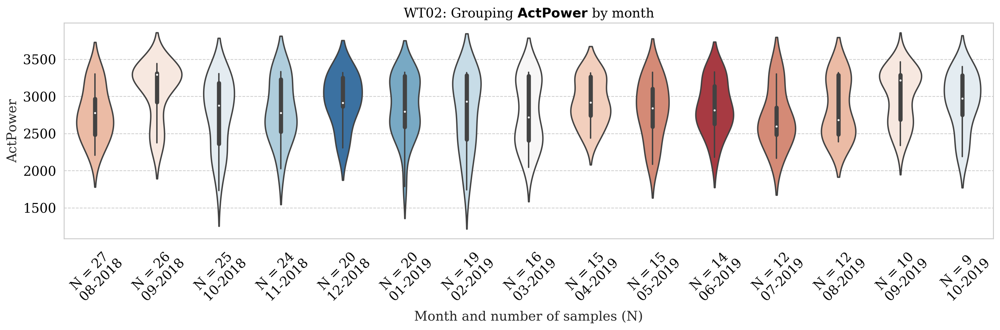

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


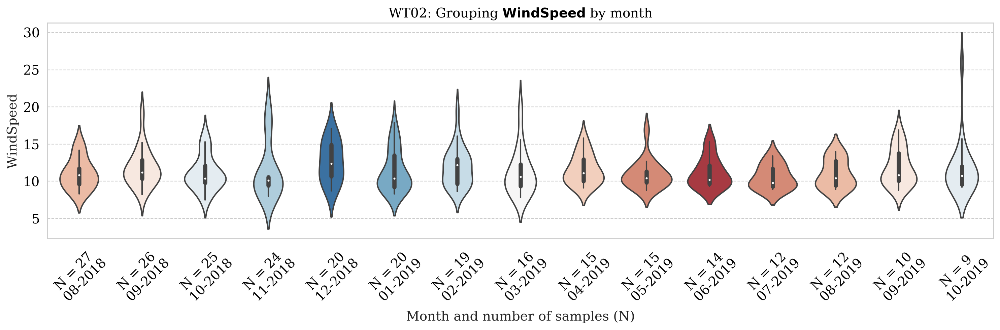

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


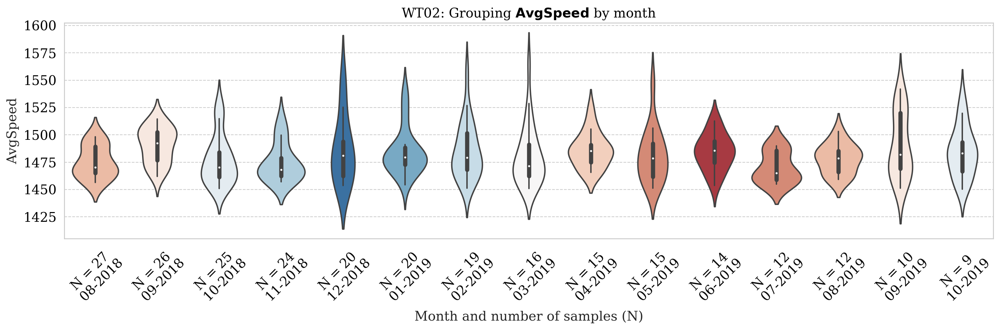

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


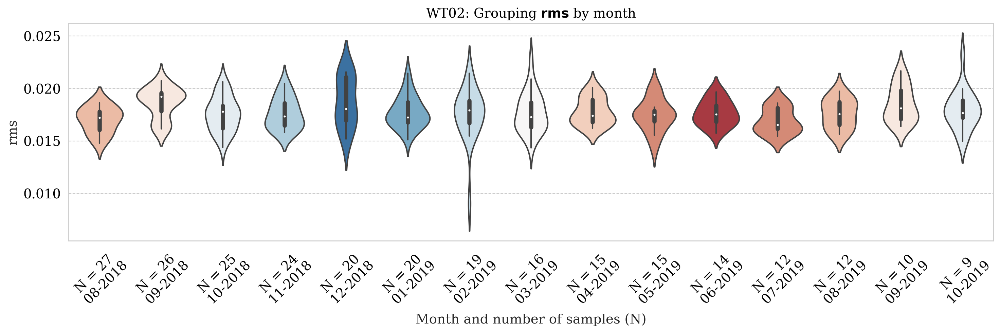

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


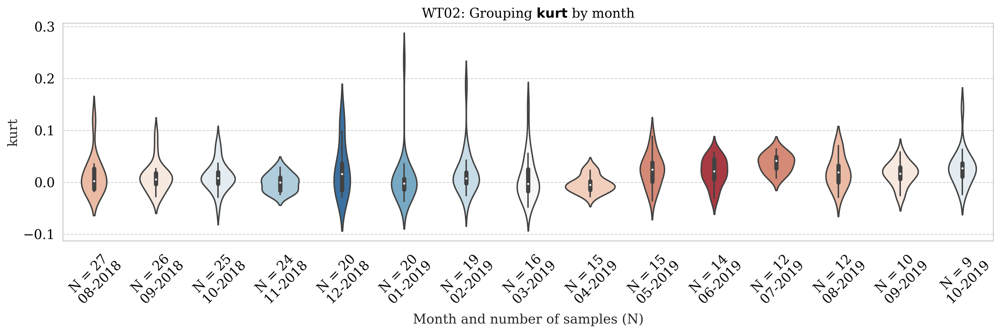

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


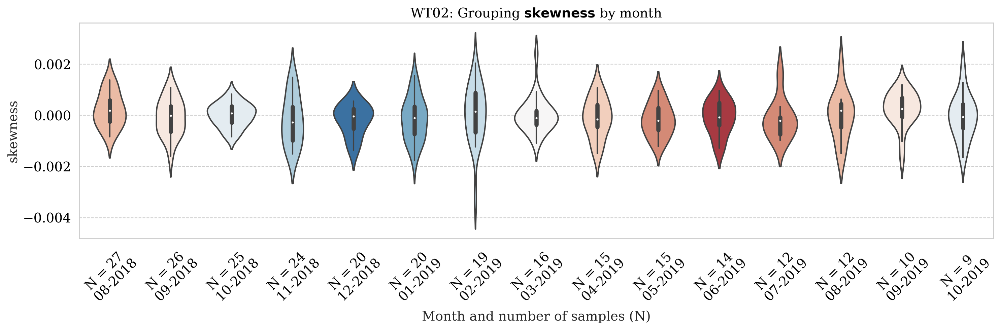

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


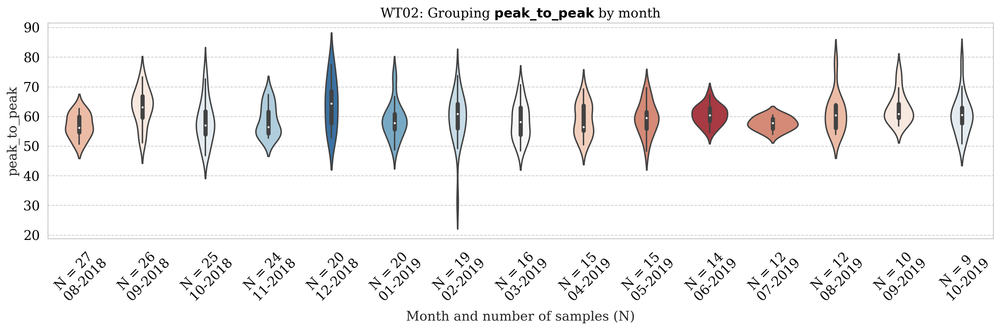

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


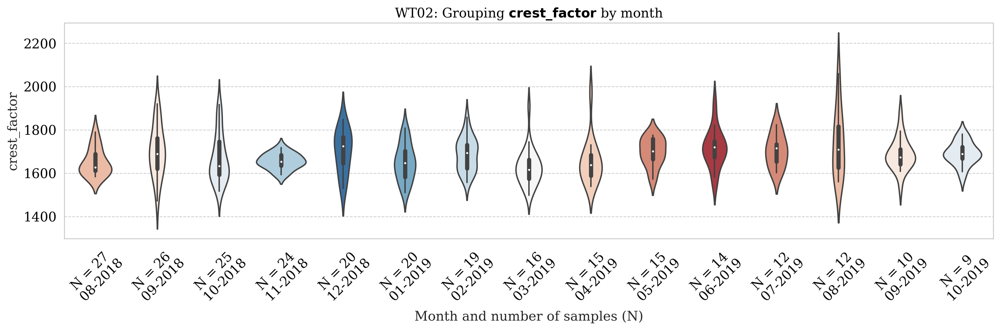

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


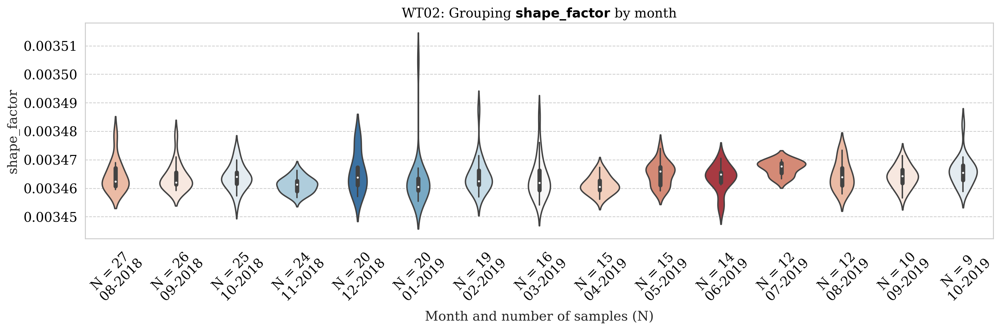

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


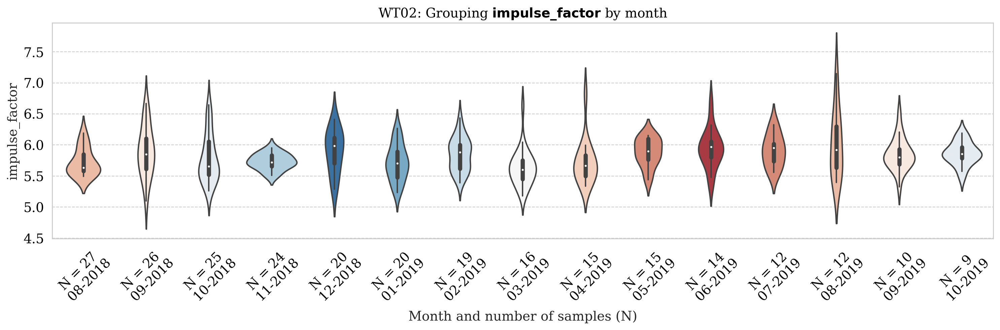

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


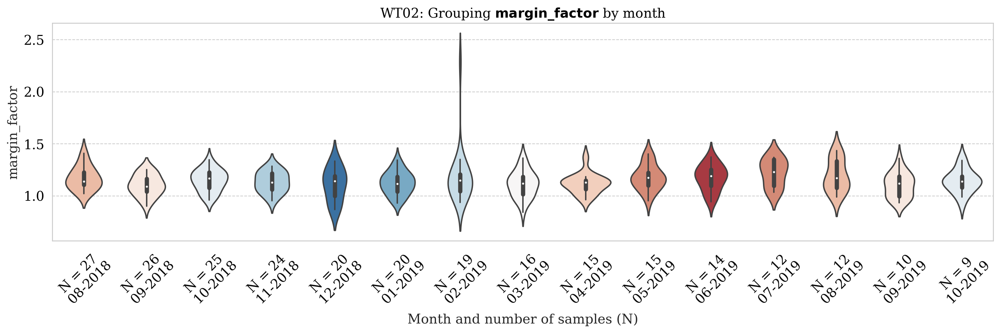

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


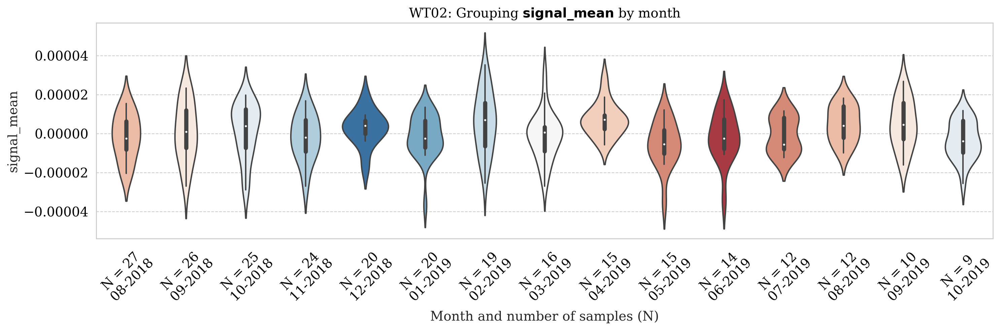

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


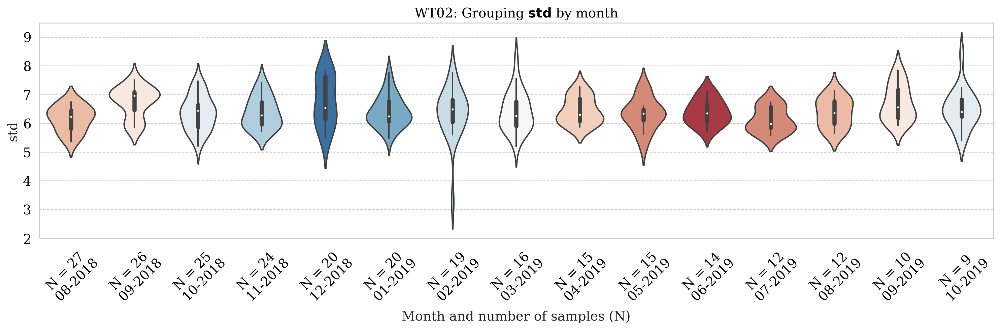

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


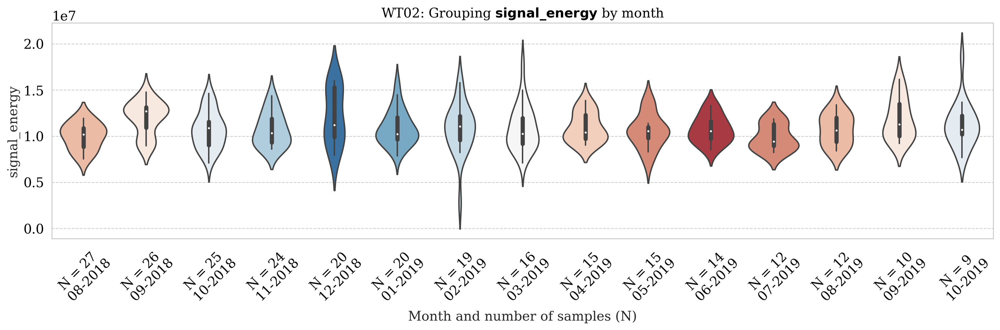

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


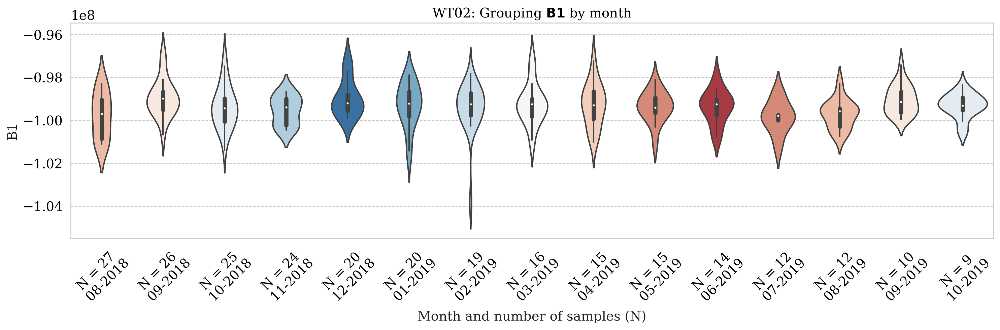

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


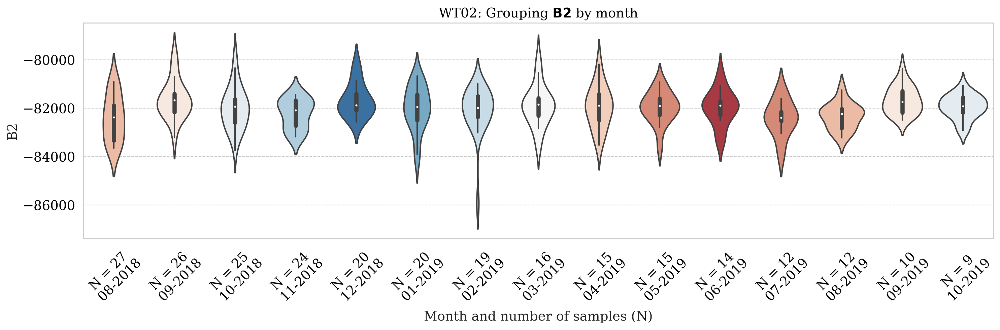

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


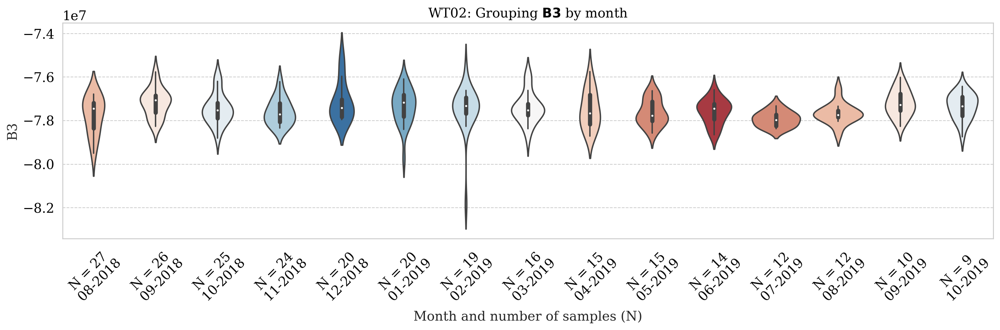

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


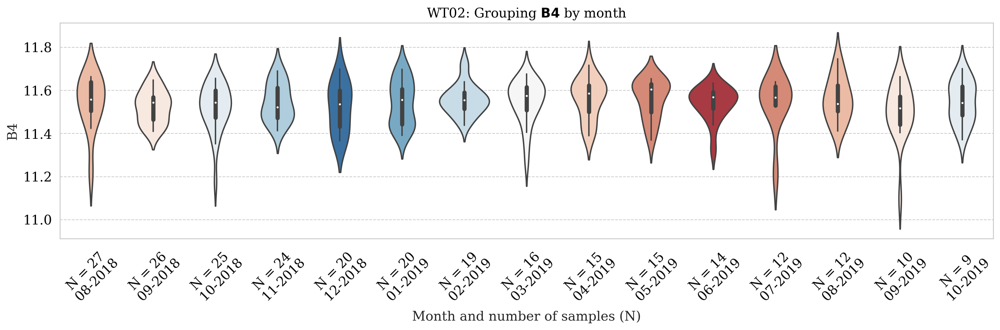

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


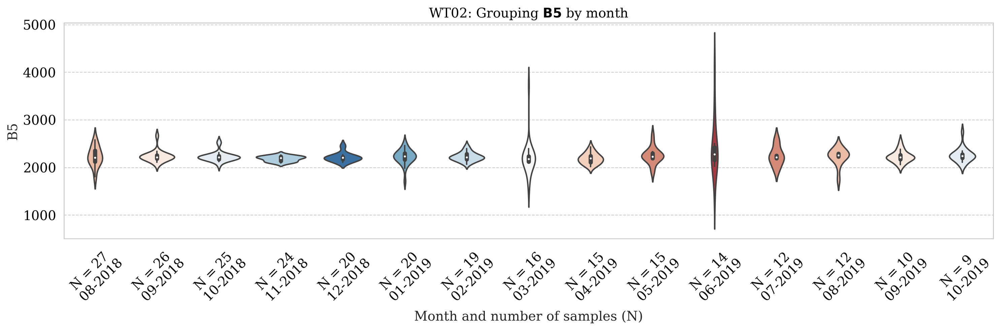

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


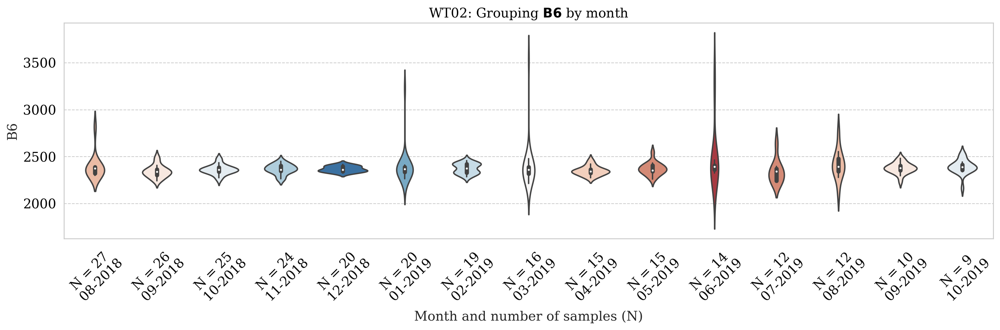

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


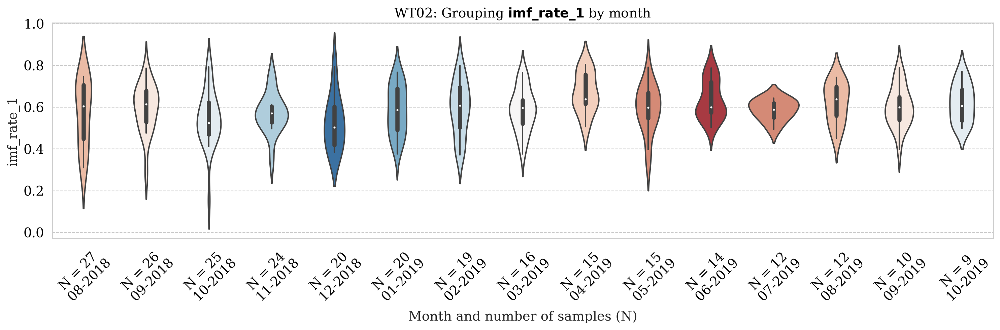

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


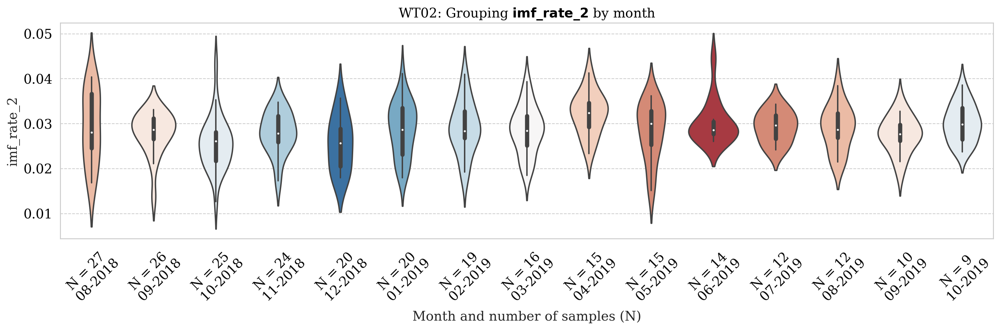

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


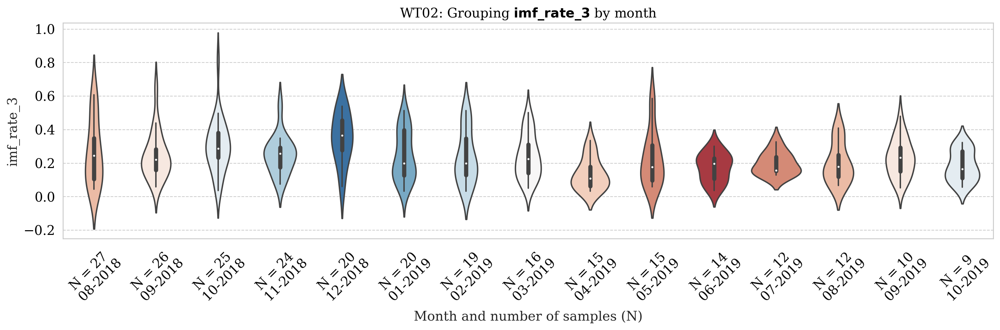

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


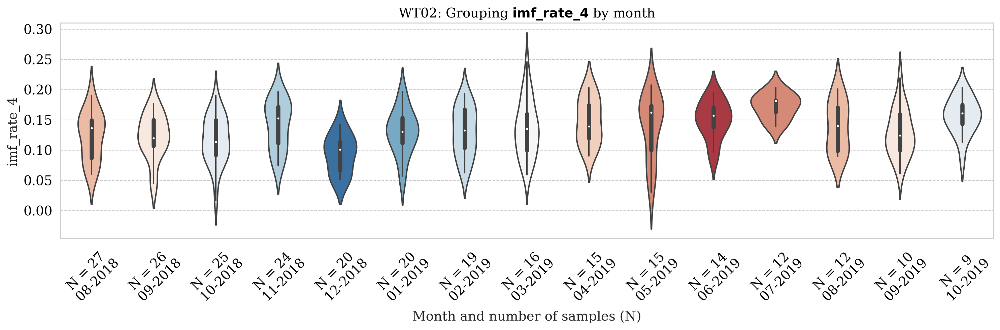

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


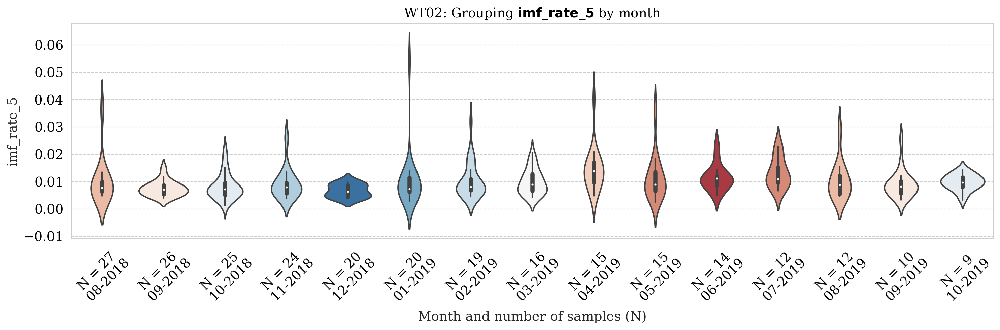

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


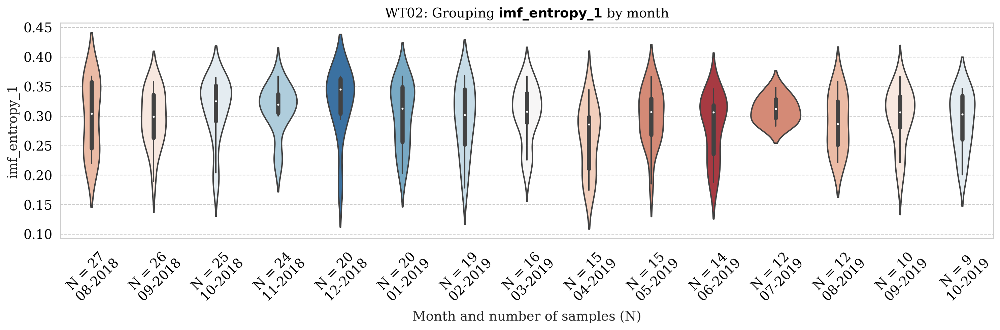

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


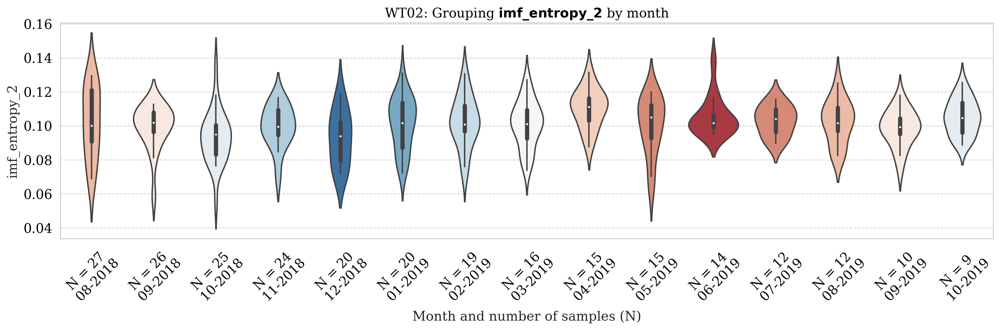

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


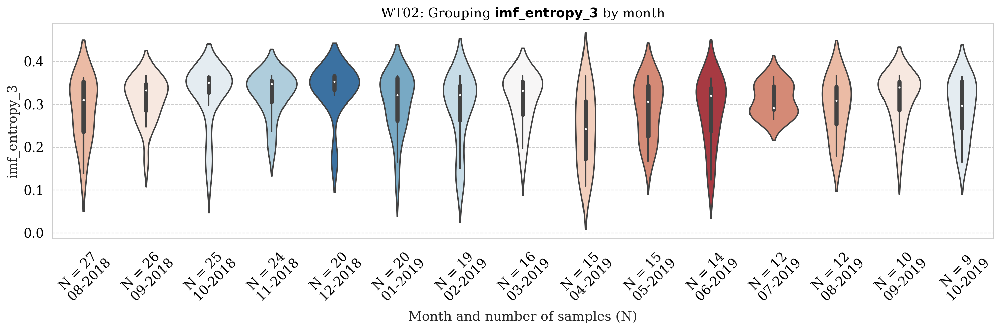

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


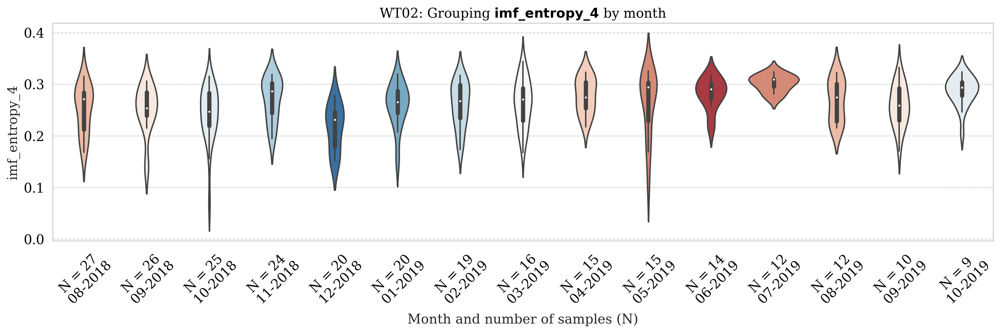

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


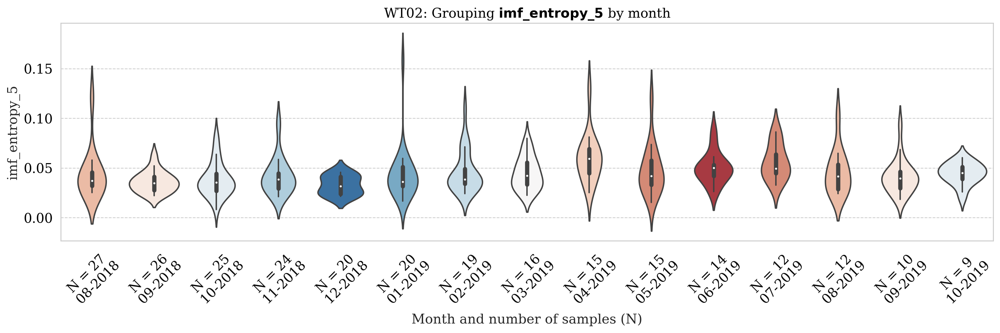

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


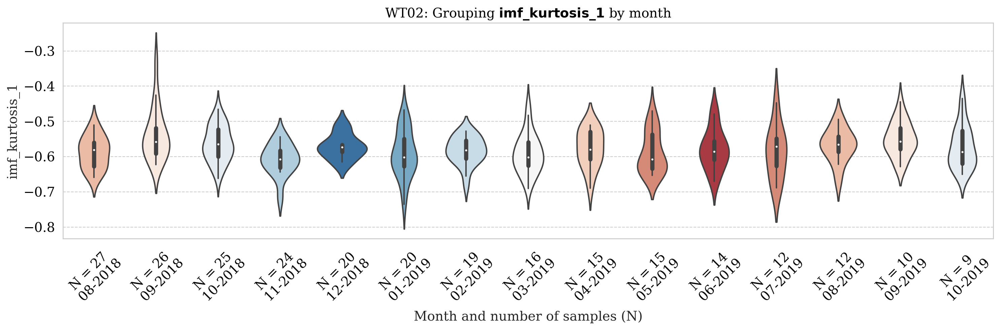

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


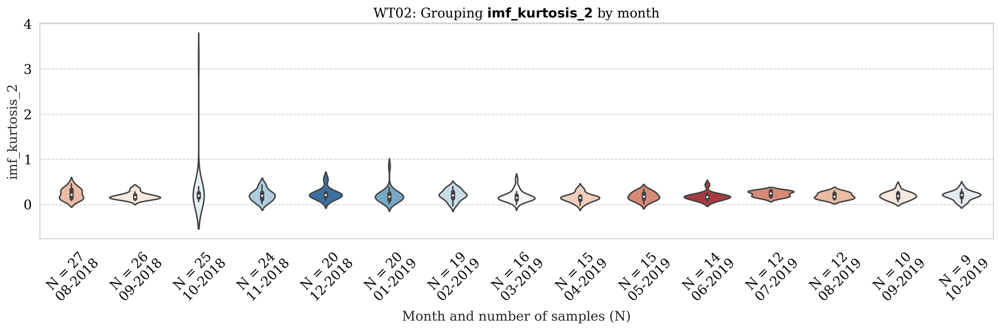

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


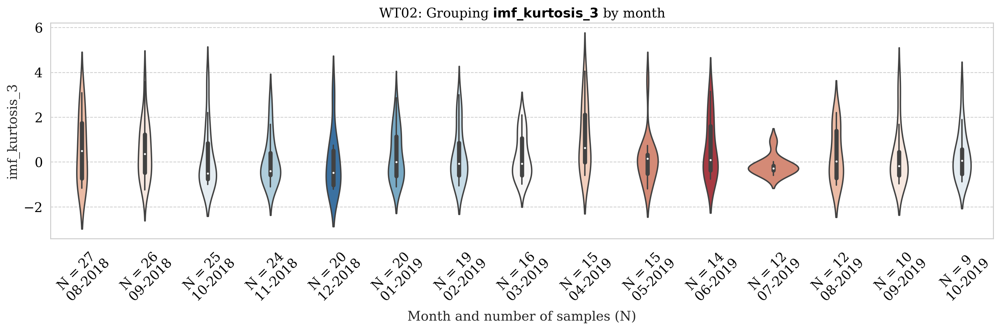

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


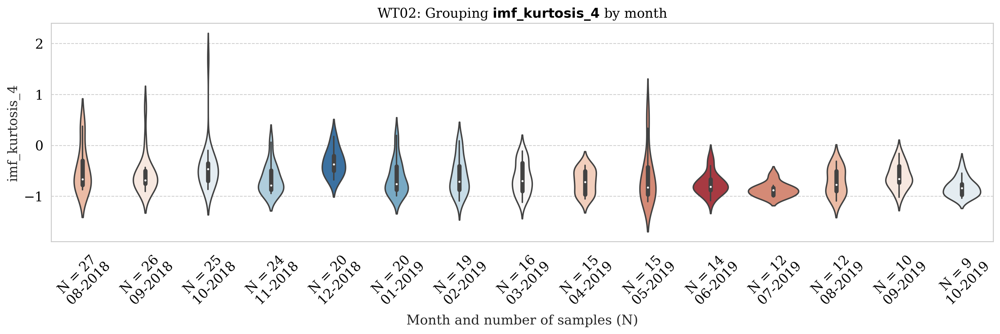

[27, 26, 25, 24, 20, 20, 19, 16, 15, 15, 14, 12, 12, 10, 9]


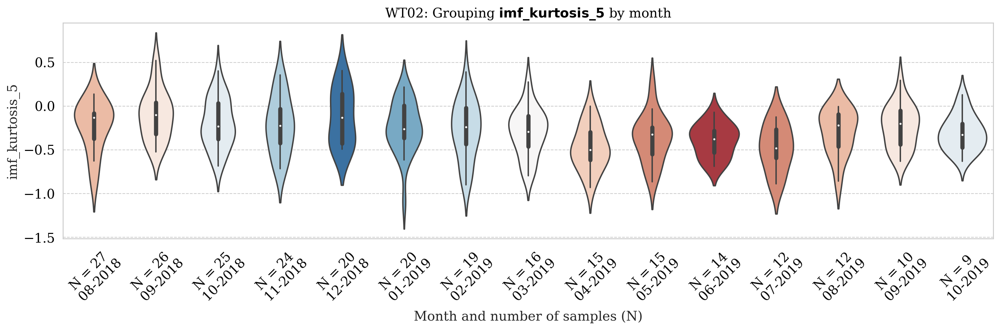

In [29]:
result = pd.merge(features_cleaned,
                  new_times_df,
                  left_on='Index',
                  right_on='Index',
                  how='left')

date_old_format=(result['Date']).values



# print(date_old_format)

import datetime
def reformat_date(date):    
    my_date = datetime.datetime.strptime(date, "%Y-%m")
    return (my_date.strftime("%m-%Y"))

result['Date']=[reformat_date(d) for d in date_old_format]

# Now, plot it: 


features_to_plot = ['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5']

plot_season_groups(result,features_to_plot,wtnum)

# Correlation plot

In [30]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

Is this created on the raw features_cleaned?

Is this created on the raw features_cleaned

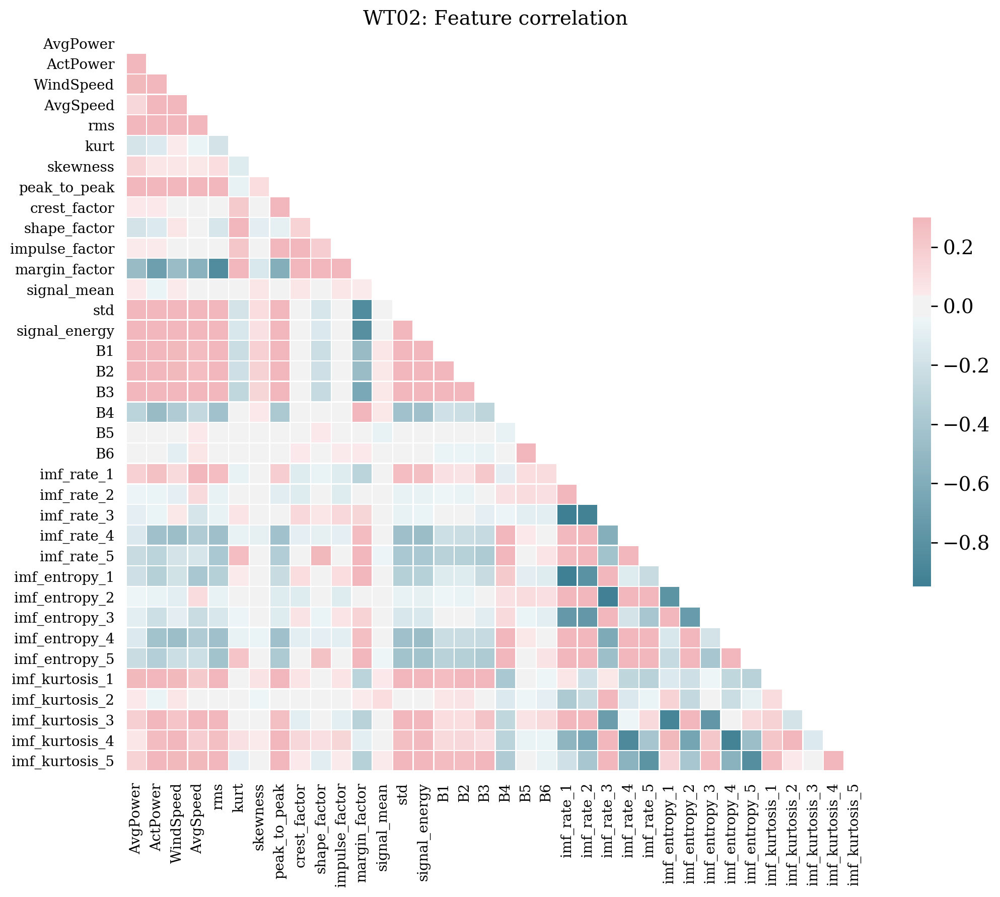

In [31]:
features_cleaned_corr = features_cleaned.drop(['Index'],axis=1)
correlation_plot.create_save_correlation_plot(f'wt0{wtnum}_features',f'WT0{wtnum}: Feature correlation',features_cleaned_corr)

# Clustering

The function below, ```calculate_cluster_stats```, is used to calculate statistics from each cluster. In particular, we are here looking for clusters that consist of higher indexes, i.e. vibration intervals taken at a later point in time. These later intervals are more likely to have fault characteristics visible.

In [32]:
def calculate_cluster_stats(clusterDict):
    '''
        Args:
            clusterDict (Dictionary):
                keys (Integer): cluster index
                values (List): List containing index of intevals
        Returns:
            df_stats (pd.DataFrame): DataFrame containing stats about the cluster input.
    '''
    df=[]
    means=[]
    num_intervals=[]
    num_intervals_greater_than_350=[]
    percentage_greater_than_350=[]
    for i in range(len(clusterDict)):
        mean=np.mean(clusterDict[i])
        num_interval=len(clusterDict[i])
        num_interval_greater_than_350=len(list(filter(lambda index: index > 350, clusterDict[i])))
        percentage=round((num_interval_greater_than_350/num_interval)*100)

        means.append(mean)
        num_intervals.append(num_interval)
        num_intervals_greater_than_350.append(num_interval_greater_than_350)
        percentage_greater_than_350.append(percentage)


    df.append(num_intervals)
    df.append(means)
    df.append(num_intervals_greater_than_350)
    df.append(percentage_greater_than_350)
    df=np.asarray(df)


    df_stats = pd.DataFrame(data=df.T,columns=['number_of_intervals_in_cluster','avg_index','number_of_indexes_greater_than_350','percentage_intervals_greater_than_350'])
    return df_stats

**Anomaly** detecion is performed using three approaches:
 - **[1]** Some stats on the df
 - **[2]** DB-scan clustering
 - **[3]** KMeans clustering
 - **[4]** Isolation forest

In [33]:
wt_num = 2

,Index
197,303
198,304
199,309
200,310
201,311
...,...
259,411
260,412
261,413
262,415


Some initial stats on the data, after all cleaning:
########################################
    - There are 45 signals over index 350
    - There are 219 signals below index 350
    - There are 21 signals between 300 and 350
########################################
LOCS: [-100.    0.  100.  200.  300.  400.  500.]
labels 
['\n2019-07-15', '0\n2018-08-04', '100\n2018-11-09', '200\n2019-03-02', '300\n2019-06-13', '400\n2019-10-05', '']


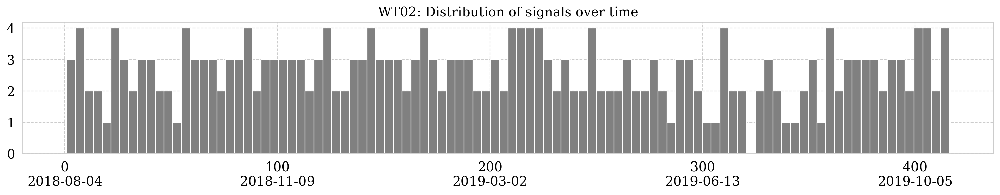

In [38]:
signals_over_index_350=(features_cleaned['Index'][features_cleaned['Index']>350]).shape

signals_0_to_100 = pd.DataFrame(data=features_cleaned['Index'][features_cleaned['Index']>300],columns=['Index'])

signals_300_to_350 = pd.DataFrame(data=features_cleaned['Index'][features_cleaned['Index']>300],columns=['Index'])
display(signals_300_to_350)
signals_300_to_350 = (signals_300_to_350['Index'][signals_300_to_350['Index']<350]).shape

print('Some initial stats on the data, after all cleaning:')
print('########################################')
print(f'    - There are {signals_over_index_350[0]} signals over index 350')
print(f'    - There are {features_cleaned.shape[0]-signals_over_index_350[0]} signals below index 350')
print(f'    - There are {signals_300_to_350[0]} signals between 300 and 350')
print('########################################')

# plt.scatter(features_cleaned['Index'],features_cleaned.index,s=20,edgecolor='#072159',color='none')
# features_cleaned['Index'].plot.scatter(x='index',y='Index')

'''
fig, ax = plt.subplots(figsize=(15, 4))
                       
ax=sns.violinplot(features_cleaned['Index'],color='lightgrey',title='Distribution of signals over time',ax=ax)
ax.set_title('WT04: Distribution of signal indexes')
plt.xlim(-100,530)
plt.setp(ax.collections, alpha=.5)
plt.tight_layout()

locs = ax.get_xticks()

labels = [item.get_text() for item in ax.get_xticklabels()]
for i in range(1,6):
    labels[i] = labels[i] + '\n' + (str(df_times_unfiltered['Date'].iloc[int(locs[i])])).split(' ')[0]

ax.set_xticklabels(labels)
'''

plt.figure(figsize=(15,3))
axx=(features_cleaned['Index']).hist(color='grey',bins=100)
#plt.margins(0)

locs = axx.get_xticks()
print('LOCS:',locs)
labels = [item.get_text() for item in axx.get_xticklabels()]

labels = [str(int(x)) for x in locs]
#labels = ["%.2f" % x for x in locs]


labels[0]=''
labels[-1]='' 
# labels=['', '0', '100', '200', '300', '400', '']
print('labels',labels[0])
# labels=['0','100','200','300','400']
for i in range(len(locs)-1):
    labels[i] = labels[i] + '\n' + (str(df_times_unfiltered['Date'].iloc[int(locs[i])])).split(' ')[0]

print(labels)
    
axx.set_xticklabels(labels)

plt.title(f'WT0{wtnum}: Distribution of signals over time')
plt.tight_layout()


save_path=f'../../plots/cluster_results'
plt.savefig(f'{save_path}/wt_{wt_num}_signal_distribution.png',dpi=300)
plt.show()

In [ ]:
axx=(features_cleaned['Index']).hist(color='grey')

In [ ]:
df_times_unfiltered

## K-means raw (features_cleaned)
First, count the number of points after 350:


In [46]:
def kmeans(dataset_name,wt_num,SELECTED_FEATURES,max_cluster_num,print_latex=False,plottitle=''):

    '''INITIAL ELBOW METHOD:'''
    # plotting an additional plot which is not needed here
    cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans', knn_clusters=max_cluster_num,plot=False,dataset_name=dataset_name)
    
    # finding the max clusters based on values
    # Use calculate_cluster_stats to optimize.
    final_array=[]
    final_df = []
    max_cluster_number=[]
    intervals_in_max_cluster=[]
    max_percentages=[]
    intervals_greater_than_350=[]
    number_of_clusters=[]
    for i in tqdm(range(2,max_cluster_num+1)):
        cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans',knn_clusters=i,plot=False) # Cluster the points
        clusterDict=clustering.plot_clusters(plottitle,wt_num,i,cluster_labels,SELECTED_FEATURES,plot=False) # plot the clusters
        cluster_df=calculate_cluster_stats(clusterDict)
        display(cluster_df)

        # Do some more work here... Add them to an array and build a dataframe
        max_percentage=(cluster_df['percentage_intervals_greater_than_350'].max())
        temp=cluster_df[cluster_df['percentage_intervals_greater_than_350']==max_percentage]
        interval_in_cluster = (temp['number_of_intervals_in_cluster'].max())
        
        get_cluster = temp[temp['number_of_intervals_in_cluster']==interval_in_cluster]
        intervals_in_cluster_above_350 = get_cluster['number_of_indexes_greater_than_350']
                
        max_cluster_number.append(i)
        intervals_in_max_cluster.append(interval_in_cluster) # number of intervals in the max cluster (the cluster with most of the interesting points)
        intervals_greater_than_350.append(intervals_in_cluster_above_350.values[0]) # number of intervals greater tha 350
        max_percentages.append(max_percentage)

    # Appending to array        
    final_df.append(max_cluster_number)
    final_df.append(intervals_in_max_cluster)
    final_df.append(intervals_greater_than_350)
    final_df.append(max_percentages)

    final_df=np.asarray(final_df)

    final_df=pd.DataFrame(final_df.T,columns=['max_cluster_number','intervals_in_max_cluster','intervals_greater_than_350','max_percentages'])
    
    # Converting final_df columns to ints, except from the percentage column.
    for feat in final_df.columns:
        if feat != 'max_percentages':
            final_df[feat]=final_df[feat].apply(lambda x: int(x))
        else:
            continue
    
    #final_df.style.set_precision(0)
    text=(df_to_latex(final_df,False))
    if print_latex == True:
        print(text)
    #display(final_df)

    return final_df

 `run_kmeans` and select K based on the results of the next cell

In [47]:
# Run K-means with the selected K and df.
def run_kmeans(plottitle,wt_num, dataset_name, data_set,k,selected_cluster=None,**features_to_pairplot):
    '''
    INPUTS:
        - data_set (Pandas Dataframe): The feature dataset.
    OUTPUTS:
        - cluster_df (Pandas DataFrame): Df containing clusters and samples.
    '''
    SELECTED_FEATURES=data_set
    max_cluster_num = k
    
    '''
    df = kmeans(wt_num_string,SELECTED_FEATURES,max_cluster_num,dataset_name)

    #plt.scatter(df.max_cluster_number,df.max_percentages)
    #plt.show()

    display(df)
    '''
    SELECTED_CLUSTER_NUMBER = k # need to optimize this value

    # now plot this:
    
    # plotting elbow. 
    cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans',knn_clusters=SELECTED_CLUSTER_NUMBER,plot=True,dataset_name=dataset_name,selected_cluster=selected_cluster)

    # plotting cluster development and index distribution
    clusterDict=clustering.plot_clusters(plottitle,wt_num,k,cluster_labels,SELECTED_FEATURES,plot=True,dataset_name=dataset_name) # plot the clusters

    # display(calculate_cluster_stats(clusterDict))
    
    j=0
    if features_to_pairplot:
        for key, value in features_to_pairplot.items():
            dataset_name_= dataset_name + f'_{j}_'    
            clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, value,cluster_labels,dataset_name=dataset_name_) # pair plot 1
            '''
            else:
                print('len is less or equal to 2')
                clustering.scatter_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, value,cluster_labels,dataset_name=dataset_name_) # pair plot 1
            ''' 
            j+=1
    else:
        dataset_name1=dataset_name+'_1_'
        clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, ['AvgSpeed','rms','B4'],cluster_labels,dataset_name=dataset_name1) # pair plot 1
        dataset_name2=dataset_name+'_2_'
        clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, ['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],cluster_labels, dataset_name=dataset_name2) # pair plot 2
        cluster_df=calculate_cluster_stats(clusterDict)
        cluster_df
        
    return cluster_labels


# Some other feature sets

In [48]:
# Different subsets:
operating_features=features_cleaned[['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed']]

# Frequency-domain
bispectrum_features=features_cleaned[['B1', 'B2', 'B3', 'B4', 'B5', 'B6']]
#bispectrum_features['Index'] = features_cleaned['Index']

# Frequency-domain
time_features=features_cleaned[['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy']]

# Time-frequency features (EEMD; IMFs)
imf_features=features_cleaned[['imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5']]

# IMF kurtosis features
imf_kurt_features=features_cleaned[['imf_kurtosis_1','imf_kurtosis_2','imf_kurtosis_3','imf_kurtosis_4','imf_kurtosis_5']]

In [49]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [50]:
op_and_bispec_features = pd.concat([operating_features,bispectrum_features],axis=1)
op_and_time_features = pd.concat([operating_features,time_features],axis=1)
op_and_imf_kurtosis_features = pd.concat([operating_features,imf_kurt_features],axis=1)
op_and_imf_features = pd.concat([operating_features,imf_features],axis=1)

feature_mix=features_cleaned[['Index', 'AvgPower','WindSpeed', 'AvgSpeed','imf_rate_5','imf_kurtosis_5','B1','B5']]

features_sets= [
                op_and_bispec_features,
                op_and_time_features,
                op_and_imf_kurtosis_features,
                op_and_imf_features,
                feature_mix    
               ]

features_sets_names= [
                'op_and_bispec_features',
                'op_and_time_features',
                'op_and_imf_kurtosis_features',
                'op_and_imf_features',
                'feature_mix'
               ]

### Running through the different subsets of dataframes with kmeans

In [ ]:
import matplotlib
# this method is just for plotting the different final_dfs (the dfs comaring the K values.)

def plot_k_means_tuning(wt_num,df,feature_set_name):
    colormap = plt.cm.Blues
    normalize = matplotlib.colors.Normalize(vmin=-20, vmax=30)
    
    fig,ax=plt.subplots(figsize=(15,5))
    # df.plot.scatter(x='intervals_in_max_cluster',y='max_percentages',c='max_cluster_number',cmap='Blues',s=50,ax=ax)
    
    df.plot.scatter(x='intervals_in_max_cluster',y='max_cluster_number',c='max_percentages',cmap='Blues',s=50,ax=ax)

    # plt.scatter(df.intervals_in_max_cluster,df.max_cluster_number,s=100,c=df.max_percentages,cmap='Blues',norm=normalize)
    # plt.colorbar()
    # plt.clim(0,29)
    ax.set_ylabel('K')
    ax.set_xlabel('Total number of intervals in cluster')
    # ax.legend(title='Percentage of intervals in cluster with Index > 350')
    ax.set_title(f'{wt_num}: Parameter tuning for K-means to tune number of later intervals isolated\n Feature set: {feature_set_name}')
    plt.show()

#### The whole DF first:

In [51]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [52]:
try:
    features_cleaned = features_cleaned.drop(labels=['cluster_assigned'],axis=1)
except:
    pass
try:
    features_cleaned = features_cleaned.drop(labels=['cluster_assigned'],axis=1)
except:
    pass

len(features_cleaned.columns)
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [53]:
wt_num

2

In [54]:
# The whole DF
display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">Features cleaned:</span>'))
print(wt_num)
df=kmeans('all_36_features_initial',wt_num, features_cleaned,20,print_latex=True,plottitle='All 36 features initially')
display(df)

# plot_k_means_tuning(wt_num, df,'All 36 features')

<span style="color: #2a9d8f; font-size: 20px">Features cleaned:</span>

2
Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,95.0,216.978947,17.0,18.0
1,169.0,196.035503,28.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,123.0,215.439024,21.0,17.0
1,62.0,168.548387,9.0,15.0
2,79.0,212.582278,15.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,52.0,162.442308,7.0,13.0
1,49.0,234.448980,7.0,14.0
2,93.0,200.064516,17.0,18.0
3,70.0,217.171429,14.0,20.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,39.0,162.307692,4.0,10.0
1,45.0,236.288889,7.0,16.0
2,86.0,201.569767,15.0,17.0
3,59.0,216.542373,11.0,19.0
4,35.0,190.542857,8.0,23.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,36.0,167.750000,4.0,11.0
1,37.0,248.270270,6.0,16.0
2,82.0,200.475610,14.0,17.0
3,52.0,214.019231,11.0,21.0
4,27.0,171.444444,5.0,19.0
5,30.0,210.700000,5.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,215.538462,1.0,8.0
1,38.0,161.815789,6.0,16.0
2,25.0,175.040000,5.0,20.0
3,42.0,213.928571,8.0,19.0
4,70.0,245.071429,14.0,20.0
5,37.0,156.837838,4.0,11.0
6,39.0,217.256410,7.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,203.111111,1.0,11.0
1,31.0,163.870968,4.0,13.0
2,42.0,207.380952,7.0,17.0
3,45.0,232.111111,9.0,20.0
4,28.0,166.678571,5.0,18.0
5,33.0,220.787879,7.0,21.0
6,39.0,167.487179,6.0,15.0
7,37.0,248.513514,6.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,212.190476,3.0,14.0
1,28.0,172.250000,4.0,14.0
2,48.0,232.916667,11.0,23.0
3,15.0,148.533333,0.0,0.0
4,46.0,181.369565,9.0,20.0
5,44.0,214.886364,10.0,23.0
6,37.0,237.567568,3.0,8.0
7,1.0,189.000000,0.0,0.0
8,24.0,178.291667,5.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,22.0,178.909091,3.0,14.0
1,9.0,203.111111,1.0,11.0
2,37.0,224.243243,8.0,22.0
3,29.0,199.965517,7.0,24.0
4,31.0,163.806452,4.0,13.0
5,39.0,240.717949,8.0,21.0
6,35.0,165.028571,6.0,17.0
7,1.0,189.000000,0.0,0.0
8,31.0,201.709677,5.0,16.0
9,30.0,239.966667,3.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,203.111111,1.0,11.0
1,25.0,235.400000,2.0,8.0
2,40.0,179.950000,7.0,18.0
3,45.0,207.600000,7.0,16.0
4,27.0,190.555556,7.0,26.0
5,1.0,69.000000,0.0,0.0
6,14.0,158.071429,0.0,0.0
7,30.0,167.000000,5.0,17.0
8,1.0,189.000000,0.0,0.0
9,34.0,239.735294,8.0,24.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,199.000000,1.0,12.0
1,24.0,235.916667,2.0,8.0
2,40.0,179.950000,7.0,18.0
3,26.0,195.923077,5.0,19.0
4,24.0,172.875000,5.0,21.0
5,1.0,69.000000,0.0,0.0
6,14.0,158.071429,0.0,0.0
7,30.0,167.000000,5.0,17.0
8,1.0,189.000000,0.0,0.0
9,34.0,239.735294,8.0,24.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,193.000000,1.0,14.0
1,26.0,235.500000,4.0,15.0
2,32.0,156.781250,5.0,16.0
3,18.0,244.555556,5.0,28.0
4,22.0,189.227273,5.0,23.0
5,1.0,69.000000,0.0,0.0
6,11.0,156.363636,0.0,0.0
7,27.0,163.925926,4.0,15.0
8,1.0,189.000000,0.0,0.0
9,43.0,228.697674,8.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,6.0,178.833333,1.0,17.0
1,26.0,187.153846,4.0,15.0
2,22.0,182.636364,5.0,23.0
3,18.0,244.555556,5.0,28.0
4,22.0,189.227273,5.0,23.0
5,1.0,69.000000,0.0,0.0
6,11.0,156.363636,0.0,0.0
7,27.0,163.925926,4.0,15.0
8,1.0,189.000000,0.0,0.0
9,43.0,225.232558,7.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,211.285714,1.0,14.0
1,14.0,158.714286,0.0,0.0
2,15.0,229.000000,1.0,7.0
3,41.0,239.536585,9.0,22.0
4,19.0,204.894737,5.0,26.0
5,22.0,212.409091,5.0,23.0
6,34.0,161.735294,6.0,18.0
7,28.0,239.535714,4.0,14.0
8,23.0,210.521739,5.0,22.0
9,25.0,164.320000,4.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,211.285714,1.0,14.0
1,14.0,187.285714,1.0,7.0
2,15.0,229.000000,1.0,7.0
3,41.0,236.487805,9.0,22.0
4,22.0,190.181818,5.0,23.0
5,22.0,212.409091,5.0,23.0
6,34.0,161.735294,6.0,18.0
7,29.0,238.413793,4.0,14.0
8,23.0,210.521739,5.0,22.0
9,19.0,155.315789,3.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,211.285714,1.0,14.0
1,8.0,180.125000,0.0,0.0
2,14.0,226.928571,1.0,7.0
3,37.0,240.864865,8.0,22.0
4,22.0,190.181818,5.0,23.0
5,22.0,209.090909,5.0,23.0
6,19.0,156.947368,2.0,11.0
7,28.0,245.892857,5.0,18.0
8,23.0,210.521739,5.0,22.0
9,19.0,156.631579,3.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,22.0,244.636364,2.0,9.0
1,11.0,179.818182,1.0,9.0
2,11.0,232.090909,1.0,9.0
3,11.0,298.181818,4.0,36.0
4,30.0,222.533333,7.0,23.0
5,30.0,189.966667,5.0,17.0
6,16.0,197.875000,3.0,19.0
7,21.0,222.333333,3.0,14.0
8,1.0,137.000000,0.0,0.0
9,20.0,152.650000,3.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,6.0,216.500000,1.0,17.0
1,8.0,180.125000,0.0,0.0
2,14.0,246.500000,2.0,14.0
3,14.0,222.714286,3.0,21.0
4,21.0,181.476190,4.0,19.0
5,19.0,216.105263,4.0,21.0
6,24.0,172.791667,4.0,17.0
7,23.0,248.260870,2.0,9.0
8,17.0,231.058824,5.0,29.0
9,18.0,160.777778,3.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,5.0,214.000000,1.0,20.0
1,22.0,235.045455,4.0,18.0
2,22.0,218.772727,3.0,14.0
3,17.0,256.705882,6.0,35.0
4,12.0,172.583333,2.0,17.0
5,1.0,69.000000,0.0,0.0
6,7.0,191.714286,0.0,0.0
7,28.0,161.178571,4.0,14.0
8,1.0,189.000000,0.0,0.0
9,21.0,231.571429,4.0,19.0



\begin{tabular}{rrrr}
\toprule
 max\_cluster\_number &  intervals\_in\_max\_cluster &  intervals\_greater\_than\_350 &  max\_percentages \\
\midrule
                  2 &                        95 &                          17 &             18.0 \\
                  3 &                        79 &                          15 &             19.0 \\
                  4 &                        70 &                          14 &             20.0 \\
                  5 &                        35 &                           8 &             23.0 \\
                  6 &                        52 &                          11 &             21.0 \\
                  7 &                        70 &                          14 &             20.0 \\
                  8 &                        33 &                           7 &             21.0 \\
                  9 &                        48 &                          11 &             23.0 \\
                 10 &                        29 & 

,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,95,17,18.0
1,3,79,15,19.0
2,4,70,14,20.0
3,5,35,8,23.0
4,6,52,11,21.0
5,7,70,14,20.0
6,8,33,7,21.0
7,9,48,11,23.0
8,10,29,7,24.0
9,11,27,7,26.0


### Selecting K=17 and producing plots

In [ ]:
features_cleaned.columns

Marker-styles not there.


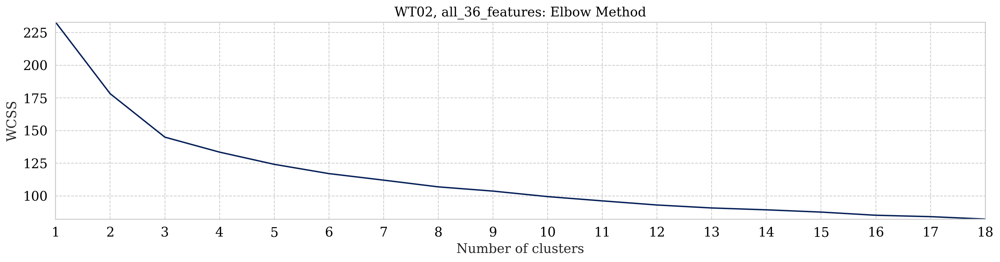

Did not replace


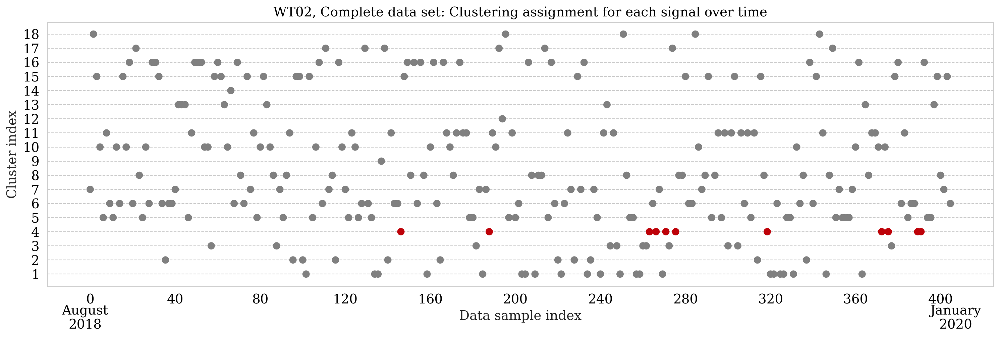

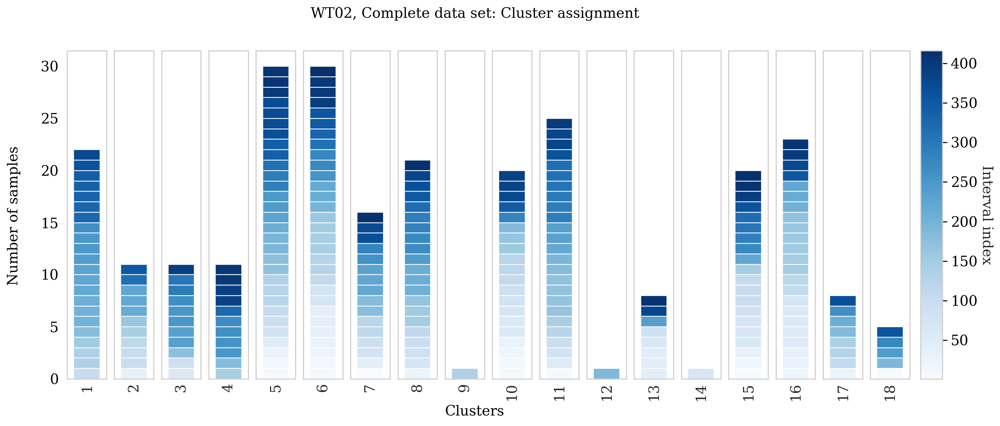

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


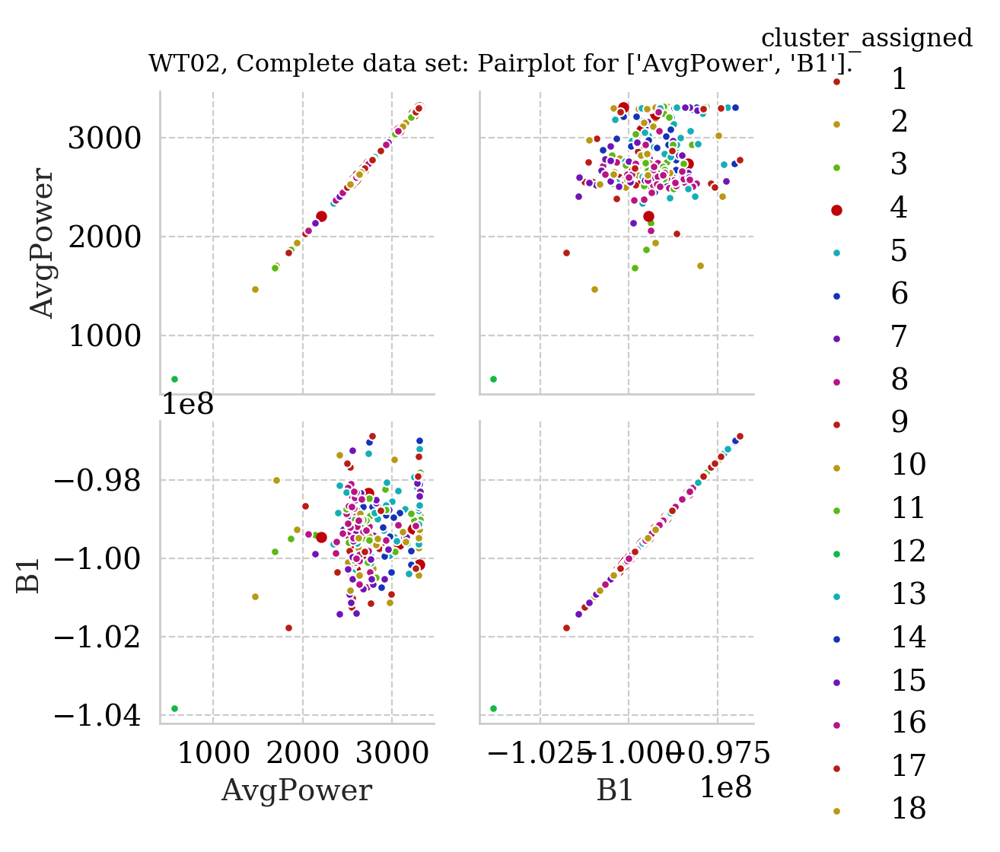

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


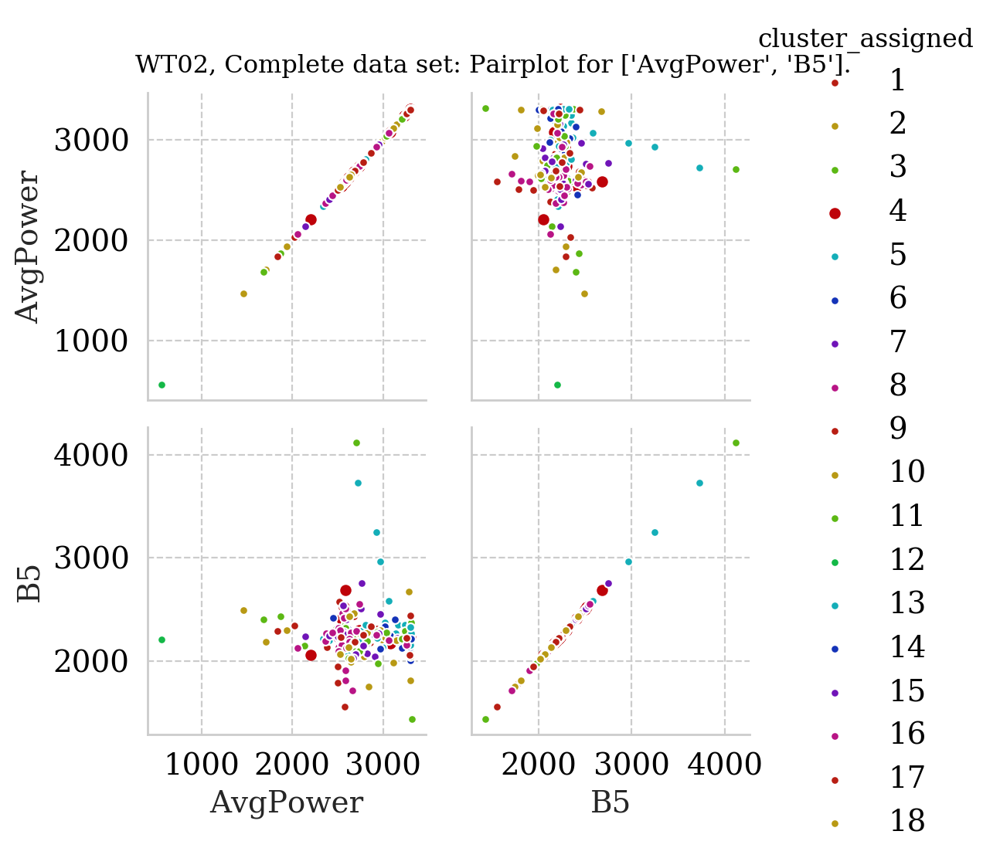

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


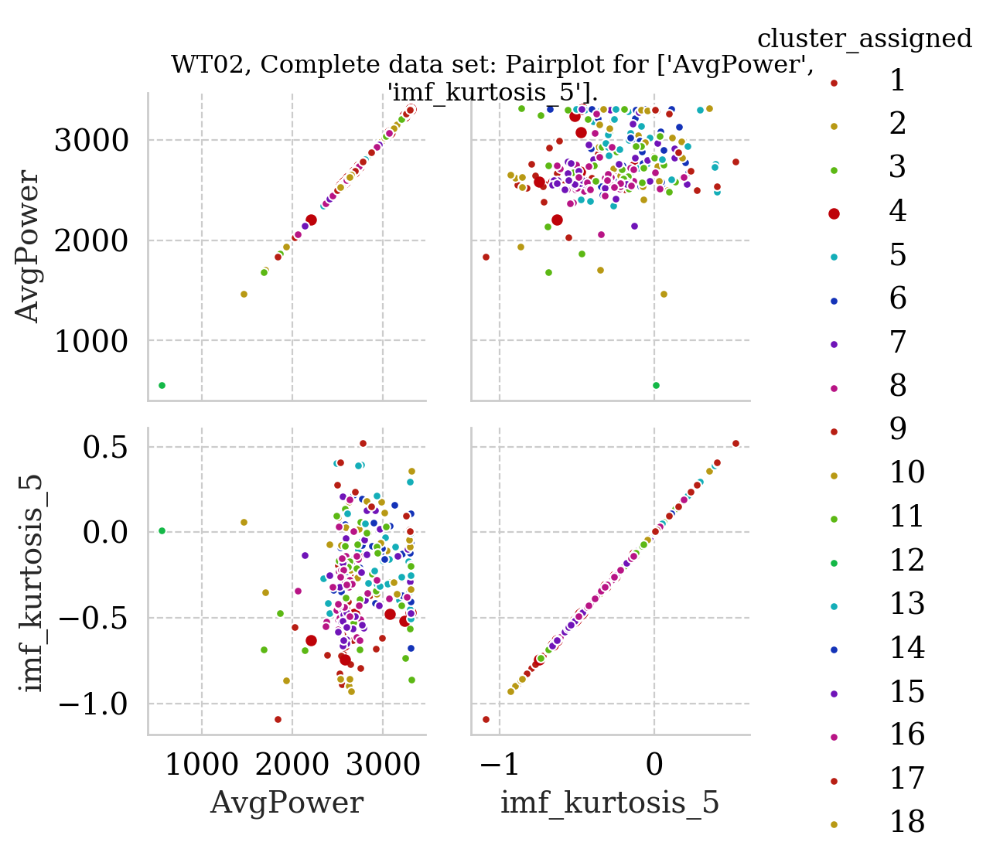

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


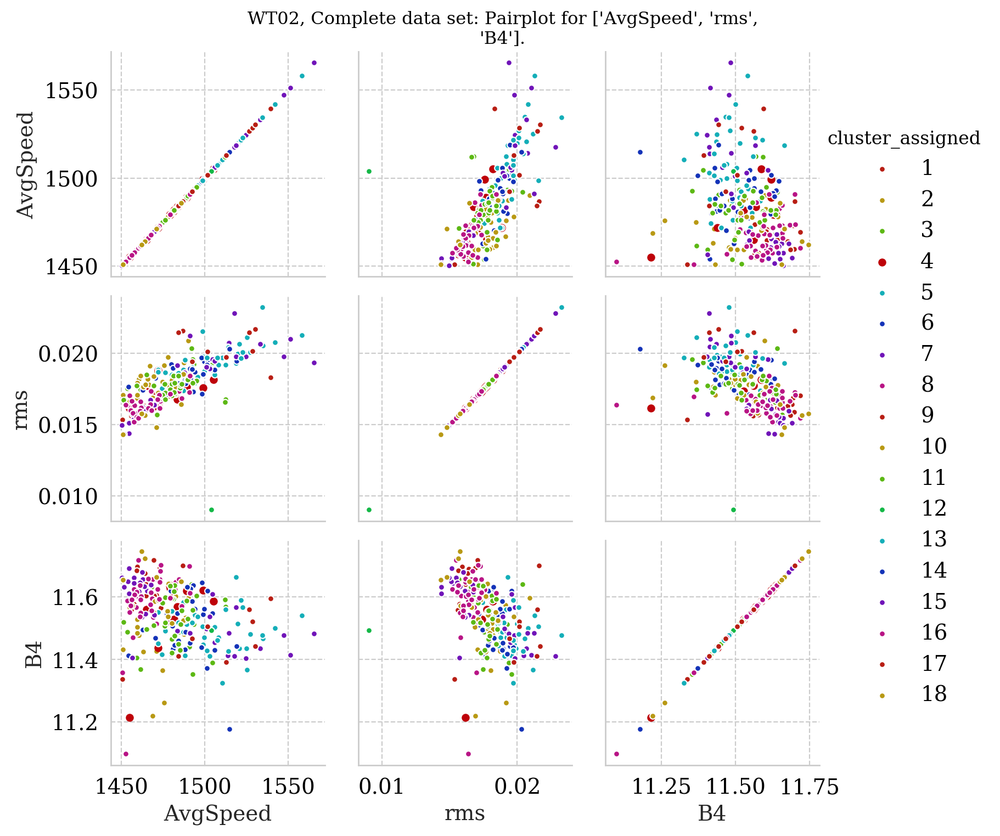

KeyboardInterrupt: 

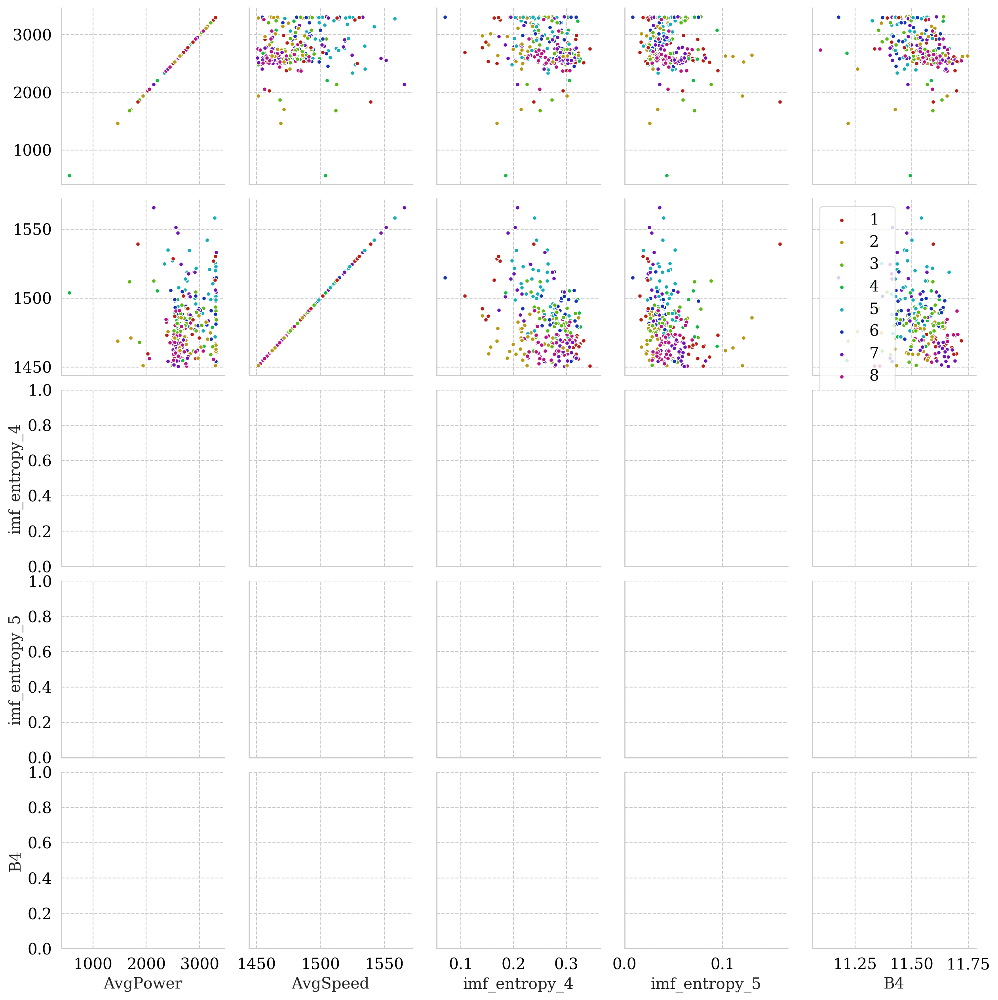

In [55]:
#ddef run_kmeans(plottitle,wt_num, dataset_name, data_set,k,selected_cluster=None,**features_to_pairplot):
wt_num_string='2'
assigned = run_kmeans('Complete data set',wt_num_string,'all_36_features', features_cleaned,18,
                      selected_cluster=3,
                      fset1=['AvgPower','B1'],
                      fset2=['AvgPower','B5'],
                      fset3=['AvgPower','imf_kurtosis_5'],
                      fset4=['AvgSpeed','rms','B4'],
                      fset5=['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],
                      fset6=['AvgPower','AvgSpeed','B1', 'B2','B3'],
                      fset7=['AvgPower','AvgSpeed','B1'],
                      fset8=['AvgPower','B1','B3','imf_kurtosis_5'])

# Study the printed table as well.

#### Now, running the other subsets

In [56]:
wt_num = '2'
for i,features in enumerate(features_sets):
    try:
        features=features.drop(['cluster_assigned'],axis=1)
    except:
        print("Could not remove cluster_assigned")
    print(features.columns)
    display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">{features_sets_names[i]}:</span>'))    
    df=kmeans(features_sets_names[i],wt_num, features,20,print_latex=False,plottitle=f'{features_sets_names[i]} Initially')
    display(df)
    plt.show()

Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'B1', 'B2',
       'B3', 'B4', 'B5', 'B6'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_bispec_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,137.0,206.321168,21.0,15.0
1,127.0,200.606299,24.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,56.0,193.660714,10.0,18.0
1,112.0,202.062500,16.0,14.0
2,96.0,211.114583,19.0,20.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,74.0,214.405405,15.0,20.0
1,58.0,190.086207,10.0,17.0
2,87.0,211.528736,17.0,20.0
3,45.0,187.755556,3.0,7.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,49.0,209.142857,10.0,20.0
1,79.0,211.189873,15.0,19.0
2,88.0,199.170455,16.0,18.0
3,4.0,236.500000,0.0,0.0
4,44.0,189.500000,4.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,58.0,201.000000,9.0,16.0
1,49.0,190.775510,9.0,18.0
2,49.0,198.959184,9.0,18.0
3,36.0,194.777778,3.0,8.0
4,68.0,221.029412,15.0,22.0
5,4.0,236.500000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,25.0,215.440000,7.0,28.0
1,70.0,211.328571,12.0,17.0
2,62.0,210.000000,14.0,23.0
3,4.0,236.500000,0.0,0.0
4,40.0,182.325000,2.0,5.0
5,45.0,181.977778,5.0,11.0
6,18.0,228.666667,5.0,28.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,224.666667,8.0,33.0
1,63.0,200.238095,9.0,14.0
2,63.0,228.730159,13.0,21.0
3,37.0,207.594595,7.0,19.0
4,35.0,167.914286,3.0,9.0
5,19.0,157.052632,1.0,5.0
6,4.0,236.500000,0.0,0.0
7,19.0,202.000000,4.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,70.0,216.028571,13.0,19.0
1,30.0,154.200000,1.0,3.0
2,35.0,173.200000,2.0,6.0
3,49.0,227.816327,12.0,24.0
4,22.0,242.181818,8.0,36.0
5,1.0,189.000000,0.0,0.0
6,20.0,190.400000,4.0,20.0
7,4.0,236.500000,0.0,0.0
8,33.0,196.939394,5.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,57.0,204.333333,9.0,16.0
1,27.0,158.777778,2.0,7.0
2,31.0,173.709677,1.0,3.0
3,15.0,233.733333,4.0,27.0
4,16.0,238.562500,6.0,38.0
5,1.0,189.000000,0.0,0.0
6,10.0,228.400000,3.0,30.0
7,4.0,236.500000,0.0,0.0
8,35.0,197.857143,5.0,14.0
9,68.0,217.014706,15.0,22.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,210.333333,2.0,22.0
1,51.0,205.549020,9.0,18.0
2,17.0,206.117647,4.0,24.0
3,42.0,184.904762,5.0,12.0
4,23.0,171.956522,1.0,4.0
5,36.0,212.694444,9.0,25.0
6,45.0,216.177778,6.0,13.0
7,1.0,189.000000,0.0,0.0
8,4.0,236.500000,0.0,0.0
9,18.0,240.222222,7.0,39.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,1.0,189.000000,0.0,0.0
1,34.0,231.205882,9.0,26.0
2,30.0,183.466667,3.0,10.0
3,46.0,194.543478,7.0,15.0
4,30.0,224.233333,6.0,20.0
5,28.0,201.750000,2.0,7.0
6,14.0,229.285714,4.0,29.0
7,21.0,210.571429,6.0,29.0
8,6.0,236.666667,2.0,33.0
9,4.0,236.500000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,189.190476,2.0,10.0
1,48.0,201.375000,8.0,17.0
2,11.0,266.545455,5.0,45.0
3,35.0,231.400000,5.0,14.0
4,21.0,162.047619,1.0,5.0
5,26.0,222.423077,7.0,27.0
6,34.0,188.617647,5.0,15.0
7,28.0,187.035714,4.0,14.0
8,1.0,189.000000,0.0,0.0
9,4.0,236.500000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,25.0,201.440000,4.0,16.0
1,49.0,206.693878,9.0,18.0
2,11.0,266.545455,5.0,45.0
3,36.0,235.611111,6.0,17.0
4,22.0,163.954545,1.0,5.0
5,24.0,203.125000,5.0,21.0
6,34.0,188.617647,5.0,15.0
7,23.0,179.347826,2.0,9.0
8,1.0,189.000000,0.0,0.0
9,4.0,236.500000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,211.750000,1.0,12.0
1,21.0,171.619048,3.0,14.0
2,4.0,158.250000,0.0,0.0
3,31.0,175.129032,1.0,3.0
4,21.0,171.952381,4.0,19.0
5,48.0,209.791667,9.0,19.0
6,4.0,236.500000,0.0,0.0
7,38.0,228.210526,8.0,21.0
8,16.0,157.125000,1.0,6.0
9,18.0,216.444444,5.0,28.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,217.900000,2.0,20.0
1,20.0,178.250000,3.0,15.0
2,43.0,236.279070,8.0,19.0
3,25.0,166.800000,1.0,4.0
4,21.0,171.952381,4.0,19.0
5,27.0,188.148148,4.0,15.0
6,4.0,236.500000,0.0,0.0
7,22.0,212.045455,4.0,18.0
8,16.0,157.125000,1.0,6.0
9,18.0,216.444444,5.0,28.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,217.900000,2.0,20.0
1,20.0,174.350000,3.0,15.0
2,43.0,236.279070,8.0,19.0
3,25.0,166.800000,1.0,4.0
4,20.0,177.750000,4.0,20.0
5,27.0,188.148148,4.0,15.0
6,4.0,236.500000,0.0,0.0
7,23.0,209.652174,4.0,17.0
8,15.0,164.800000,1.0,7.0
9,15.0,234.333333,5.0,33.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,217.900000,2.0,20.0
1,17.0,160.411765,2.0,12.0
2,43.0,236.279070,8.0,19.0
3,25.0,166.800000,1.0,4.0
4,20.0,177.750000,4.0,20.0
5,27.0,188.148148,4.0,15.0
6,4.0,236.500000,0.0,0.0
7,23.0,209.652174,4.0,17.0
8,15.0,161.600000,1.0,7.0
9,15.0,234.333333,5.0,33.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,217.900000,2.0,20.0
1,17.0,160.411765,2.0,12.0
2,31.0,198.806452,3.0,10.0
3,18.0,173.833333,1.0,6.0
4,16.0,147.750000,3.0,19.0
5,26.0,194.038462,4.0,15.0
6,4.0,236.500000,0.0,0.0
7,20.0,223.300000,3.0,15.0
8,15.0,161.600000,1.0,7.0
9,15.0,234.333333,5.0,33.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,11.0,218.909091,2.0,18.0
1,17.0,160.411765,2.0,12.0
2,30.0,204.600000,3.0,10.0
3,16.0,172.687500,1.0,6.0
4,16.0,147.750000,3.0,19.0
5,26.0,194.038462,4.0,15.0
6,4.0,236.500000,0.0,0.0
7,20.0,223.300000,3.0,15.0
8,15.0,161.600000,1.0,7.0
9,15.0,234.333333,5.0,33.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,127,24,19.0
1,3,96,19,20.0
2,4,87,17,20.0
3,5,49,10,20.0
4,6,68,15,22.0
5,7,25,7,28.0
6,8,24,8,33.0
7,9,22,8,36.0
8,10,16,6,38.0
9,11,18,7,39.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_time_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,141.0,205.921986,23.0,16.0
1,123.0,200.878049,22.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,108.0,189.092593,12.0,11.0
1,95.0,198.452632,17.0,18.0
2,61.0,237.180328,16.0,26.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,37.0,184.351351,7.0,19.0
1,103.0,193.029126,12.0,12.0
2,57.0,234.491228,15.0,26.0
3,67.0,204.089552,11.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,42.0,224.714286,8.0,19.0
1,61.0,203.721311,10.0,16.0
2,38.0,197.368421,8.0,21.0
3,81.0,188.148148,11.0,14.0
4,42.0,217.571429,8.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,82.0,196.292683,11.0,13.0
1,25.0,198.520000,7.0,28.0
2,37.0,217.108108,7.0,19.0
3,63.0,207.333333,11.0,17.0
4,1.0,189.000000,0.0,0.0
5,56.0,203.571429,9.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,58.0,169.517241,5.0,9.0
1,53.0,201.735849,9.0,17.0
2,28.0,211.821429,5.0,18.0
3,34.0,194.235294,8.0,24.0
4,40.0,218.775000,7.0,18.0
5,50.0,234.880000,11.0,22.0
6,1.0,189.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,197.600000,2.0,20.0
1,78.0,190.076923,11.0,14.0
2,48.0,201.291667,6.0,12.0
3,40.0,220.150000,7.0,18.0
4,42.0,218.928571,8.0,19.0
5,22.0,192.500000,6.0,27.0
6,23.0,211.043478,5.0,22.0
7,1.0,189.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,197.600000,2.0,20.0
1,56.0,206.803571,10.0,18.0
2,48.0,199.437500,6.0,12.0
3,40.0,217.250000,7.0,18.0
4,28.0,245.964286,6.0,21.0
5,22.0,192.500000,6.0,27.0
6,23.0,211.043478,5.0,22.0
7,1.0,189.000000,0.0,0.0
8,36.0,159.944444,3.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,165.500000,1.0,12.0
1,49.0,189.816327,6.0,12.0
2,43.0,192.069767,5.0,12.0
3,15.0,187.466667,2.0,13.0
4,28.0,245.964286,6.0,21.0
5,20.0,193.250000,6.0,30.0
6,24.0,215.750000,5.0,21.0
7,1.0,189.000000,0.0,0.0
8,35.0,158.828571,3.0,9.0
9,41.0,252.902439,11.0,27.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,165.500000,1.0,12.0
1,49.0,189.816327,6.0,12.0
2,42.0,193.785714,5.0,12.0
3,17.0,185.058824,2.0,12.0
4,28.0,245.964286,6.0,21.0
5,16.0,145.312500,2.0,12.0
6,19.0,231.421053,5.0,26.0
7,1.0,189.000000,0.0,0.0
8,35.0,158.828571,3.0,9.0
9,39.0,257.128205,11.0,28.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,36.0,212.416667,5.0,14.0
1,38.0,210.342105,5.0,13.0
2,20.0,248.200000,8.0,40.0
3,21.0,157.095238,4.0,19.0
4,7.0,267.142857,2.0,29.0
5,28.0,162.178571,2.0,7.0
6,19.0,244.052632,3.0,16.0
7,36.0,171.333333,5.0,14.0
8,41.0,236.975610,10.0,24.0
9,1.0,189.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,15.0,189.133333,2.0,13.0
1,11.0,226.000000,4.0,36.0
2,39.0,183.179487,3.0,8.0
3,11.0,190.090909,1.0,9.0
4,22.0,203.136364,4.0,18.0
5,13.0,250.307692,5.0,38.0
6,29.0,228.586207,7.0,24.0
7,46.0,196.195652,5.0,11.0
8,21.0,250.571429,5.0,24.0
9,37.0,198.243243,6.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,217.153846,2.0,15.0
1,11.0,226.000000,4.0,36.0
2,31.0,178.709677,3.0,10.0
3,10.0,173.900000,0.0,0.0
4,20.0,231.000000,4.0,20.0
5,13.0,250.307692,5.0,38.0
6,28.0,222.035714,6.0,21.0
7,45.0,193.066667,5.0,11.0
8,19.0,262.473684,5.0,26.0
9,33.0,210.484848,7.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,17.0,181.941176,1.0,6.0
1,32.0,188.062500,4.0,12.0
2,30.0,194.833333,4.0,13.0
3,13.0,185.692308,1.0,8.0
4,22.0,242.272727,4.0,18.0
5,9.0,135.000000,1.0,11.0
6,11.0,254.454545,4.0,36.0
7,1.0,189.000000,0.0,0.0
8,24.0,199.583333,4.0,17.0
9,7.0,157.857143,1.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,134.083333,1.0,8.0
1,32.0,244.031250,8.0,25.0
2,16.0,188.812500,1.0,6.0
3,28.0,236.892857,6.0,21.0
4,30.0,214.266667,5.0,17.0
5,7.0,305.142857,2.0,29.0
6,22.0,173.590909,2.0,9.0
7,19.0,203.473684,4.0,21.0
8,16.0,223.812500,6.0,38.0
9,25.0,154.560000,1.0,4.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,14.0,206.214286,2.0,14.0
1,31.0,179.354839,3.0,10.0
2,30.0,181.266667,3.0,10.0
3,13.0,185.692308,1.0,8.0
4,23.0,249.608696,5.0,22.0
5,9.0,135.000000,1.0,11.0
6,11.0,254.454545,4.0,36.0
7,1.0,189.000000,0.0,0.0
8,20.0,183.150000,3.0,15.0
9,25.0,243.680000,6.0,24.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,202.000000,1.0,14.0
1,31.0,180.096774,3.0,10.0
2,27.0,184.703704,3.0,11.0
3,11.0,180.545455,1.0,9.0
4,23.0,249.608696,5.0,22.0
5,8.0,134.500000,1.0,12.0
6,11.0,254.454545,4.0,36.0
7,1.0,189.000000,0.0,0.0
8,23.0,177.956522,3.0,13.0
9,23.0,242.695652,5.0,22.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,204.000000,2.0,17.0
1,30.0,176.600000,3.0,10.0
2,27.0,185.777778,3.0,11.0
3,11.0,180.545455,1.0,9.0
4,12.0,261.916667,4.0,33.0
5,8.0,134.500000,1.0,12.0
6,11.0,254.454545,4.0,36.0
7,1.0,189.000000,0.0,0.0
8,23.0,178.173913,3.0,13.0
9,23.0,242.173913,5.0,22.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,201.666667,2.0,17.0
1,31.0,174.000000,3.0,10.0
2,28.0,183.178571,3.0,11.0
3,11.0,180.545455,1.0,9.0
4,12.0,261.916667,4.0,33.0
5,6.0,120.833333,1.0,17.0
6,13.0,254.923077,4.0,31.0
7,1.0,189.000000,0.0,0.0
8,23.0,178.173913,3.0,13.0
9,22.0,234.909091,4.0,18.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,123,22,18.0
1,3,61,16,26.0
2,4,57,15,26.0
3,5,38,8,21.0
4,6,25,7,28.0
5,7,34,8,24.0
6,8,22,6,27.0
7,9,22,6,27.0
8,10,20,6,30.0
9,11,10,4,40.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_imf_kurtosis_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,151.0,205.794702,24.0,16.0
1,113.0,200.601770,21.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,85.0,197.505882,18.0,21.0
1,61.0,194.590164,9.0,15.0
2,118.0,212.584746,18.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,42.0,192.023810,9.0,21.0
1,86.0,209.604651,14.0,16.0
2,53.0,198.000000,7.0,13.0
3,83.0,206.722892,15.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,62.0,233.370968,13.0,21.0
1,37.0,167.756757,5.0,14.0
2,43.0,197.488372,5.0,12.0
3,79.0,202.151899,12.0,15.0
4,43.0,200.116279,10.0,23.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,190.968750,8.0,25.0
1,51.0,234.784314,7.0,14.0
2,40.0,205.725000,5.0,12.0
3,56.0,186.982143,8.0,14.0
4,52.0,223.173077,13.0,25.0
5,33.0,162.212121,4.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,31.0,197.096774,8.0,26.0
1,43.0,244.465116,8.0,19.0
2,38.0,201.000000,5.0,13.0
3,49.0,183.734694,7.0,14.0
4,49.0,213.285714,9.0,18.0
5,27.0,163.518519,3.0,11.0
6,27.0,207.925926,5.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,3.0,120.333333,0.0,0.0
1,48.0,218.312500,9.0,19.0
2,39.0,202.076923,5.0,13.0
3,52.0,180.269231,7.0,13.0
4,27.0,158.333333,3.0,11.0
5,29.0,208.758621,6.0,21.0
6,27.0,216.703704,8.0,30.0
7,39.0,242.769231,7.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,3.0,120.333333,0.0,0.0
1,46.0,206.847826,8.0,17.0
2,24.0,223.083333,4.0,17.0
3,41.0,191.512195,7.0,17.0
4,21.0,155.142857,2.0,10.0
5,30.0,215.500000,6.0,20.0
6,27.0,210.925926,8.0,30.0
7,42.0,238.238095,7.0,17.0
8,30.0,174.566667,3.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,3.0,120.333333,0.0,0.0
1,45.0,211.711111,11.0,24.0
2,16.0,241.062500,5.0,31.0
3,38.0,185.078947,4.0,11.0
4,20.0,161.700000,2.0,10.0
5,30.0,205.300000,5.0,17.0
6,24.0,188.958333,6.0,25.0
7,42.0,237.452381,7.0,17.0
8,27.0,207.296296,4.0,15.0
9,19.0,182.473684,1.0,5.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,26.0,177.307692,4.0,15.0
1,42.0,241.285714,10.0,24.0
2,11.0,161.272727,2.0,18.0
3,30.0,210.100000,5.0,17.0
4,15.0,245.333333,5.0,33.0
5,31.0,193.451613,5.0,16.0
6,20.0,142.350000,1.0,5.0
7,4.0,178.750000,0.0,0.0
8,25.0,185.280000,4.0,16.0
9,32.0,242.937500,5.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,18.0,201.388889,5.0,28.0
1,35.0,240.885714,6.0,17.0
2,36.0,197.416667,4.0,11.0
3,40.0,237.300000,8.0,20.0
4,18.0,160.388889,3.0,17.0
5,8.0,259.375000,3.0,38.0
6,20.0,173.750000,4.0,20.0
7,1.0,69.000000,0.0,0.0
8,13.0,158.153846,1.0,8.0
9,23.0,160.826087,2.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,245.843750,5.0,16.0
1,26.0,175.269231,4.0,15.0
2,21.0,185.000000,2.0,10.0
3,19.0,221.631579,5.0,26.0
4,16.0,233.562500,5.0,31.0
5,24.0,199.125000,3.0,12.0
6,28.0,176.642857,4.0,14.0
7,14.0,132.785714,1.0,7.0
8,36.0,256.027778,10.0,28.0
9,24.0,154.166667,2.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,29.0,172.827586,4.0,14.0
1,38.0,257.052632,10.0,26.0
2,10.0,140.700000,1.0,10.0
3,15.0,243.466667,4.0,27.0
4,14.0,253.928571,5.0,36.0
5,29.0,189.758621,5.0,17.0
6,20.0,147.000000,1.0,5.0
7,3.0,174.000000,0.0,0.0
8,27.0,180.296296,4.0,15.0
9,30.0,244.500000,5.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,25.0,201.400000,4.0,16.0
1,33.0,239.666667,5.0,15.0
2,15.0,207.466667,4.0,27.0
3,15.0,178.133333,1.0,7.0
4,20.0,214.900000,4.0,20.0
5,24.0,182.791667,4.0,17.0
6,29.0,171.931034,4.0,14.0
7,14.0,207.571429,4.0,29.0
8,5.0,183.200000,0.0,0.0
9,2.0,191.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,18.0,226.222222,4.0,22.0
1,30.0,234.666667,4.0,13.0
2,15.0,207.466667,4.0,27.0
3,18.0,159.944444,2.0,11.0
4,21.0,229.047619,4.0,19.0
5,28.0,175.035714,4.0,14.0
6,14.0,184.642857,4.0,29.0
7,14.0,207.571429,4.0,29.0
8,5.0,183.200000,0.0,0.0
9,2.0,191.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,244.916667,3.0,12.0
1,15.0,148.133333,0.0,0.0
2,13.0,153.615385,1.0,8.0
3,18.0,247.722222,4.0,22.0
4,11.0,222.363636,3.0,27.0
5,17.0,222.470588,2.0,12.0
6,38.0,186.473684,7.0,18.0
7,15.0,133.733333,1.0,7.0
8,27.0,258.000000,7.0,26.0
9,17.0,219.058824,3.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,11.0,222.363636,3.0,27.0
1,15.0,248.933333,3.0,20.0
2,16.0,217.750000,4.0,25.0
3,20.0,248.850000,6.0,30.0
4,31.0,185.483871,5.0,16.0
5,16.0,159.500000,3.0,19.0
6,7.0,190.000000,1.0,14.0
7,23.0,171.434783,2.0,9.0
8,13.0,225.538462,3.0,23.0
9,17.0,161.882353,2.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,230.700000,3.0,30.0
1,10.0,211.100000,3.0,30.0
2,16.0,232.437500,5.0,31.0
3,21.0,240.047619,6.0,29.0
4,24.0,182.791667,4.0,17.0
5,11.0,128.363636,1.0,9.0
6,7.0,187.571429,1.0,14.0
7,23.0,173.521739,2.0,9.0
8,13.0,225.538462,3.0,23.0
9,18.0,158.833333,2.0,11.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,154.500000,0.0,0.0
1,14.0,243.642857,4.0,29.0
2,21.0,158.714286,2.0,10.0
3,15.0,242.666667,3.0,20.0
4,19.0,216.105263,4.0,21.0
5,7.0,244.142857,2.0,29.0
6,30.0,238.633333,8.0,27.0
7,11.0,181.090909,3.0,27.0
8,12.0,169.833333,3.0,25.0
9,9.0,113.555556,1.0,11.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,113,21,19.0
1,3,85,18,21.0
2,4,42,9,21.0
3,5,43,10,23.0
4,6,52,13,25.0
5,7,31,8,26.0
6,8,27,8,30.0
7,9,27,8,30.0
8,10,16,5,31.0
9,11,15,5,33.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_imf_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,158.0,188.417722,25.0,16.0
1,106.0,226.160377,20.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,114.0,217.473684,20.0,18.0
1,70.0,162.814286,9.0,13.0
2,80.0,219.425000,16.0,20.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,41.0,185.853659,9.0,22.0
1,66.0,218.015152,12.0,18.0
2,46.0,153.108696,4.0,9.0
3,111.0,222.441441,20.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,40.0,158.675000,4.0,10.0
1,51.0,249.372549,9.0,18.0
2,43.0,191.930233,9.0,21.0
3,49.0,211.387755,9.0,18.0
4,81.0,198.358025,14.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,39.0,158.076923,4.0,10.0
1,51.0,213.274510,10.0,20.0
2,73.0,203.657534,14.0,19.0
3,52.0,240.673077,8.0,15.0
4,39.0,187.564103,8.0,21.0
5,10.0,200.400000,1.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,46.0,176.065217,8.0,17.0
1,25.0,206.760000,3.0,12.0
2,35.0,247.857143,5.0,14.0
3,55.0,227.509091,10.0,18.0
4,36.0,157.138889,3.0,8.0
5,27.0,191.148148,7.0,26.0
6,40.0,211.725000,9.0,22.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,142.857143,0.0,0.0
1,26.0,183.807692,6.0,23.0
2,33.0,231.212121,9.0,27.0
3,69.0,208.478261,13.0,19.0
4,42.0,249.261905,7.0,17.0
5,29.0,157.413793,4.0,14.0
6,9.0,203.111111,1.0,11.0
7,35.0,202.485714,5.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,173.458333,3.0,12.0
1,34.0,230.617647,9.0,26.0
2,60.0,214.300000,11.0,18.0
3,40.0,246.250000,6.0,15.0
4,37.0,192.270270,6.0,16.0
5,17.0,202.117647,4.0,24.0
6,9.0,203.111111,1.0,11.0
7,16.0,119.812500,0.0,0.0
8,27.0,175.407407,5.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,6.0,201.166667,1.0,17.0
1,44.0,226.840909,9.0,20.0
2,30.0,205.933333,7.0,23.0
3,18.0,133.055556,1.0,6.0
4,26.0,217.346154,4.0,15.0
5,18.0,196.555556,5.0,28.0
6,45.0,179.755556,8.0,18.0
7,32.0,240.656250,4.0,12.0
8,25.0,177.000000,3.0,12.0
9,20.0,228.900000,3.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,6.0,201.166667,1.0,17.0
1,37.0,214.135135,6.0,16.0
2,30.0,205.933333,7.0,23.0
3,12.0,119.916667,0.0,0.0
4,23.0,216.347826,4.0,17.0
5,17.0,205.647059,5.0,29.0
6,27.0,169.370370,5.0,19.0
7,29.0,255.931034,5.0,17.0
8,24.0,168.375000,2.0,8.0
9,20.0,228.900000,3.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,167.250000,4.0,17.0
1,25.0,214.280000,4.0,16.0
2,35.0,226.142857,7.0,20.0
3,20.0,229.100000,3.0,15.0
4,20.0,189.300000,4.0,20.0
5,25.0,238.840000,2.0,8.0
6,7.0,185.142857,1.0,14.0
7,11.0,111.272727,0.0,0.0
8,26.0,192.153846,5.0,19.0
9,16.0,228.437500,5.0,31.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,161.047619,3.0,14.0
1,17.0,220.294118,3.0,18.0
2,34.0,214.441176,5.0,15.0
3,19.0,225.578947,3.0,16.0
4,20.0,189.300000,4.0,20.0
5,24.0,237.625000,2.0,8.0
6,8.0,199.000000,1.0,12.0
7,11.0,111.272727,0.0,0.0
8,26.0,192.153846,5.0,19.0
9,14.0,211.214286,4.0,29.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,161.047619,3.0,14.0
1,17.0,220.294118,3.0,18.0
2,34.0,214.441176,5.0,15.0
3,20.0,229.100000,3.0,15.0
4,20.0,189.300000,4.0,20.0
5,24.0,237.625000,2.0,8.0
6,6.0,193.166667,1.0,17.0
7,11.0,111.272727,0.0,0.0
8,26.0,192.153846,5.0,19.0
9,14.0,211.214286,4.0,29.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,5.0,129.800000,0.0,0.0
1,23.0,186.304348,4.0,17.0
2,31.0,208.290323,6.0,19.0
3,9.0,203.111111,1.0,11.0
4,18.0,202.333333,3.0,17.0
5,22.0,228.227273,4.0,18.0
6,14.0,189.500000,1.0,7.0
7,18.0,154.111111,3.0,17.0
8,12.0,232.083333,3.0,25.0
9,17.0,232.764706,3.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,4.0,91.750000,0.0,0.0
1,21.0,197.190476,4.0,19.0
2,32.0,214.656250,7.0,22.0
3,8.0,199.000000,1.0,12.0
4,14.0,194.928571,2.0,14.0
5,15.0,207.466667,2.0,13.0
6,19.0,200.578947,3.0,16.0
7,15.0,139.200000,1.0,7.0
8,10.0,207.400000,2.0,20.0
9,18.0,230.277778,4.0,22.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,177.208333,5.0,21.0
1,15.0,247.133333,3.0,20.0
2,31.0,224.161290,5.0,16.0
3,19.0,236.263158,3.0,16.0
4,16.0,214.687500,4.0,25.0
5,19.0,229.210526,1.0,5.0
6,6.0,193.166667,1.0,17.0
7,18.0,113.277778,0.0,0.0
8,26.0,192.153846,5.0,19.0
9,13.0,208.923077,4.0,31.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,21.0,159.952381,3.0,14.0
1,15.0,247.133333,3.0,20.0
2,30.0,226.666667,5.0,17.0
3,15.0,247.933333,2.0,13.0
4,19.0,199.210526,4.0,21.0
5,19.0,229.210526,1.0,5.0
6,5.0,214.000000,1.0,20.0
7,18.0,130.444444,1.0,6.0
8,21.0,161.857143,1.0,5.0
9,13.0,208.923077,4.0,31.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,140.000000,0.0,0.0
1,15.0,183.466667,5.0,33.0
2,21.0,165.095238,0.0,0.0
3,39.0,238.230769,9.0,23.0
4,21.0,213.857143,4.0,19.0
5,20.0,161.650000,3.0,15.0
6,2.0,204.500000,0.0,0.0
7,16.0,251.875000,4.0,25.0
8,16.0,130.875000,1.0,6.0
9,14.0,242.142857,2.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,157.615385,2.0,15.0
1,10.0,146.700000,0.0,0.0
2,31.0,222.548387,5.0,16.0
3,14.0,241.357143,2.0,14.0
4,16.0,214.687500,4.0,25.0
5,19.0,229.210526,1.0,5.0
6,5.0,214.000000,1.0,20.0
7,15.0,120.066667,0.0,0.0
8,13.0,184.923077,1.0,8.0
9,13.0,205.769231,4.0,31.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,106,20,19.0
1,3,80,16,20.0
2,4,41,9,22.0
3,5,43,9,21.0
4,6,39,8,21.0
5,7,27,7,26.0
6,8,33,9,27.0
7,9,34,9,26.0
8,10,18,5,28.0
9,11,17,5,29.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'WindSpeed', 'AvgSpeed', 'imf_rate_5',
       'imf_kurtosis_5', 'B1', 'B5'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">feature_mix:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,161.0,210.335404,27.0,17.0
1,103.0,193.000000,18.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,134.0,191.634328,19.0,14.0
1,79.0,227.544304,14.0,18.0
2,51.0,197.803922,12.0,24.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,55.0,225.945455,9.0,16.0
1,74.0,186.851351,8.0,11.0
2,100.0,199.010000,17.0,17.0
3,35.0,216.800000,11.0,31.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,52.0,182.769231,3.0,6.0
1,94.0,189.106383,15.0,16.0
2,35.0,216.800000,11.0,31.0
3,72.0,229.958333,15.0,21.0
4,11.0,210.727273,1.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,66.0,230.000000,13.0,20.0
1,24.0,236.333333,9.0,38.0
2,34.0,139.823529,3.0,9.0
3,82.0,194.939024,15.0,18.0
4,8.0,197.250000,0.0,0.0
5,50.0,211.480000,5.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,27.0,235.629630,10.0,37.0
1,68.0,230.294118,15.0,22.0
2,50.0,220.900000,6.0,12.0
3,18.0,222.611111,2.0,11.0
4,32.0,133.906250,2.0,6.0
5,67.0,181.925373,10.0,15.0
6,2.0,97.500000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,199.777778,1.0,11.0
1,2.0,97.500000,0.0,0.0
2,37.0,237.216216,10.0,27.0
3,27.0,221.925926,9.0,33.0
4,54.0,177.296296,8.0,15.0
5,42.0,218.095238,4.0,10.0
6,39.0,154.897436,4.0,10.0
7,54.0,226.037037,9.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,6.0,186.833333,0.0,0.0
1,42.0,173.595238,6.0,14.0
2,17.0,132.705882,1.0,6.0
3,63.0,233.380952,13.0,21.0
4,58.0,190.500000,8.0,14.0
5,4.0,272.000000,0.0,0.0
6,27.0,199.666667,5.0,19.0
7,21.0,245.761905,4.0,19.0
8,26.0,218.576923,8.0,31.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,4.0,169.000000,0.0,0.0
1,19.0,134.947368,2.0,11.0
2,18.0,135.944444,1.0,6.0
3,42.0,229.404762,6.0,14.0
4,47.0,192.744681,8.0,17.0
5,3.0,265.000000,0.0,0.0
6,66.0,213.409091,14.0,21.0
7,7.0,256.000000,3.0,43.0
8,24.0,216.166667,7.0,29.0
9,34.0,220.647059,4.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,64.0,225.031250,14.0,22.0
1,13.0,141.307692,2.0,15.0
2,6.0,186.833333,0.0,0.0
3,48.0,226.958333,7.0,15.0
4,27.0,194.666667,4.0,15.0
5,28.0,162.857143,3.0,11.0
6,18.0,269.833333,8.0,44.0
7,11.0,127.181818,0.0,0.0
8,23.0,228.956522,2.0,9.0
9,25.0,158.480000,5.0,20.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,28.0,187.964286,5.0,18.0
1,20.0,215.850000,2.0,10.0
2,26.0,234.500000,5.0,19.0
3,54.0,227.518519,11.0,20.0
4,9.0,218.555556,1.0,11.0
5,12.0,216.000000,3.0,25.0
6,13.0,205.000000,4.0,31.0
7,29.0,192.689655,5.0,17.0
8,1.0,189.000000,0.0,0.0
9,12.0,119.416667,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,19.0,182.842105,3.0,16.0
1,30.0,202.300000,3.0,10.0
2,47.0,202.914894,8.0,17.0
3,16.0,225.375000,2.0,12.0
4,21.0,258.619048,9.0,43.0
5,13.0,162.692308,2.0,15.0
6,33.0,236.030303,8.0,24.0
7,1.0,189.000000,0.0,0.0
8,3.0,208.666667,0.0,0.0
9,27.0,167.296296,4.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,58.0,220.603448,11.0,19.0
1,12.0,214.916667,4.0,33.0
2,4.0,219.500000,0.0,0.0
3,45.0,226.933333,8.0,18.0
4,27.0,200.814815,6.0,22.0
5,27.0,173.814815,3.0,11.0
6,8.0,255.625000,3.0,38.0
7,11.0,127.181818,0.0,0.0
8,25.0,226.440000,3.0,12.0
9,24.0,152.208333,5.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,214.916667,4.0,33.0
1,14.0,136.500000,0.0,0.0
2,24.0,232.333333,3.0,12.0
3,35.0,227.600000,8.0,23.0
4,16.0,239.250000,4.0,25.0
5,7.0,93.428571,0.0,0.0
6,33.0,222.848485,4.0,12.0
7,27.0,154.851852,5.0,19.0
8,9.0,277.111111,4.0,44.0
9,1.0,189.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,33.0,239.151515,7.0,21.0
1,32.0,224.406250,8.0,25.0
2,20.0,161.750000,4.0,20.0
3,17.0,247.058824,3.0,18.0
4,10.0,214.400000,1.0,10.0
5,1.0,6.000000,0.0,0.0
6,33.0,177.636364,4.0,12.0
7,17.0,118.470588,0.0,0.0
8,4.0,216.500000,0.0,0.0
9,1.0,189.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,15.0,228.533333,5.0,33.0
1,30.0,185.700000,5.0,17.0
2,19.0,227.105263,2.0,11.0
3,31.0,239.870968,8.0,26.0
4,15.0,243.600000,4.0,27.0
5,7.0,93.428571,0.0,0.0
6,22.0,223.863636,2.0,9.0
7,22.0,169.909091,3.0,14.0
8,7.0,277.285714,3.0,43.0
9,1.0,189.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,14.0,241.500000,5.0,36.0
1,29.0,189.448276,4.0,14.0
2,18.0,218.166667,1.0,6.0
3,30.0,236.666667,8.0,27.0
4,16.0,244.375000,4.0,25.0
5,7.0,93.428571,0.0,0.0
6,20.0,202.900000,3.0,15.0
7,22.0,169.909091,3.0,14.0
8,7.0,277.285714,3.0,43.0
9,1.0,189.000000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,235.900000,4.0,40.0
1,20.0,158.750000,4.0,20.0
2,14.0,136.285714,1.0,7.0
3,26.0,255.807692,7.0,27.0
4,36.0,215.305556,7.0,19.0
5,3.0,265.000000,0.0,0.0
6,18.0,188.277778,4.0,22.0
7,6.0,267.000000,2.0,33.0
8,9.0,265.555556,3.0,33.0
9,25.0,205.440000,3.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,235.900000,4.0,40.0
1,20.0,158.750000,4.0,20.0
2,14.0,136.285714,1.0,7.0
3,26.0,255.807692,7.0,27.0
4,36.0,215.305556,7.0,19.0
5,3.0,265.000000,0.0,0.0
6,18.0,188.277778,4.0,22.0
7,6.0,267.000000,2.0,33.0
8,9.0,265.555556,3.0,33.0
9,25.0,205.440000,3.0,12.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,161,27,17.0
1,3,51,12,24.0
2,4,35,11,31.0
3,5,35,11,31.0
4,6,24,9,38.0
5,7,27,10,37.0
6,8,27,9,33.0
7,9,26,8,31.0
8,10,7,3,43.0
9,11,18,8,44.0


#### Selecting K-values for the other subsets and running them

In [ ]:
features_cleaned.columns

In [ ]:
features_cleaned

In [ ]:
fff=[]
for feat in feature_mix.columns[1:-1]:
    
    if feat != 'WindSpeed':
        fff.append(feat)  
        
print(fff)

In [57]:
print('wt_num_string:',wt_num_string)


wt_num_string: 2


wt_num_string: 2


<span style="color: #2a9d8f; font-size: 20px">op_and_bispec_features:</span>

Marker-styles not there.


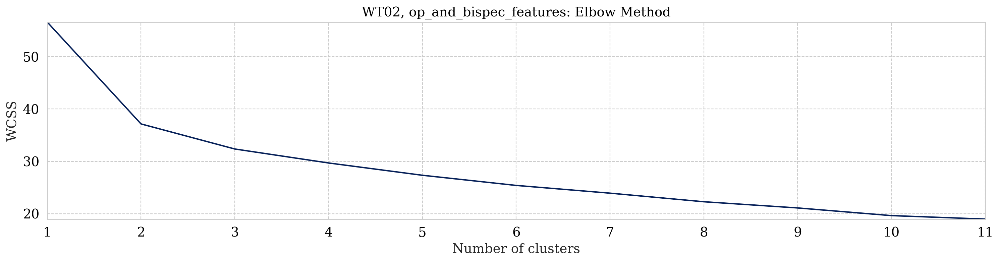

Did not replace


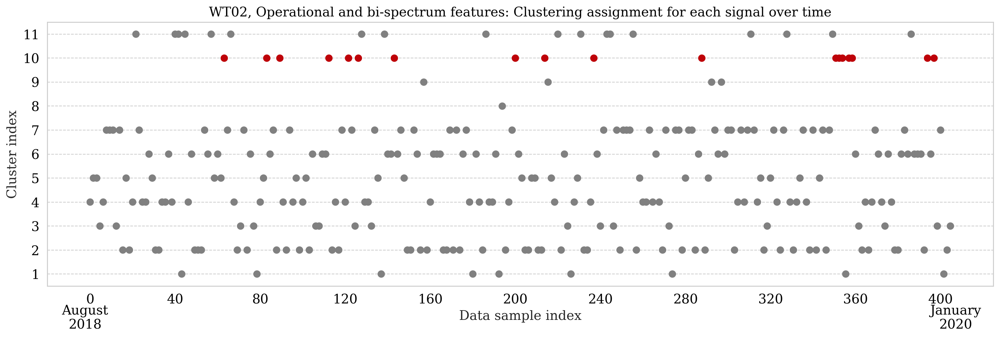

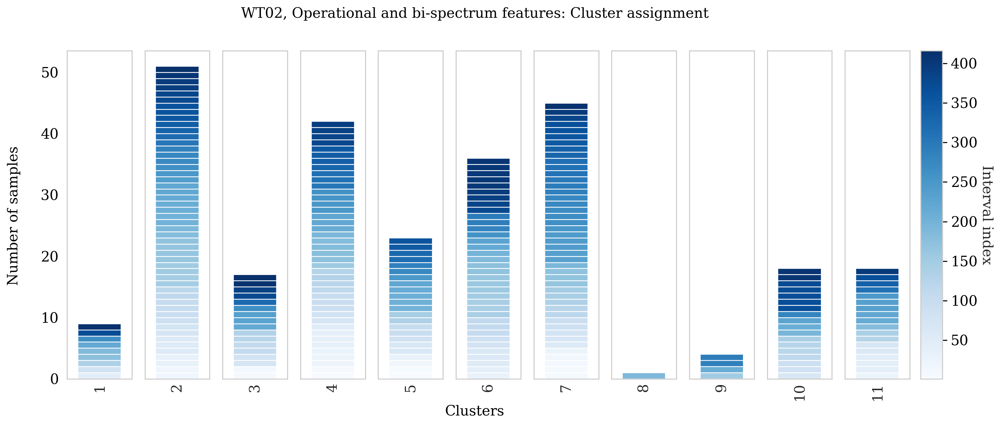

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11]


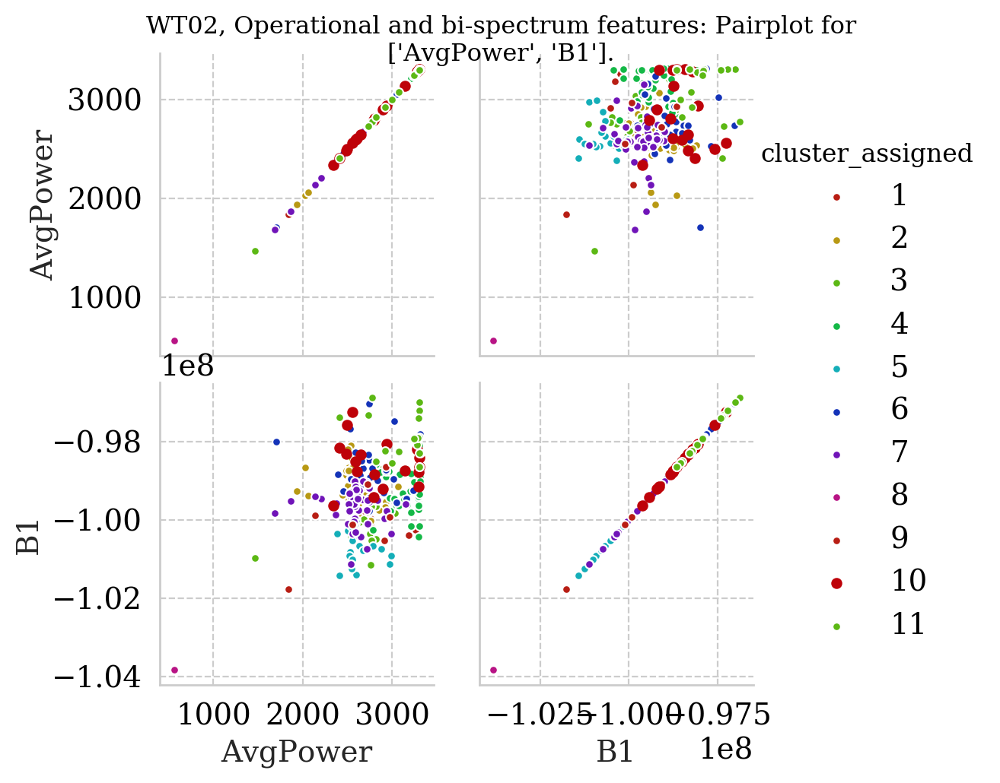

<span style="color: #2a9d8f; font-size: 20px">op_and_time_features:</span>

Marker-styles not there.


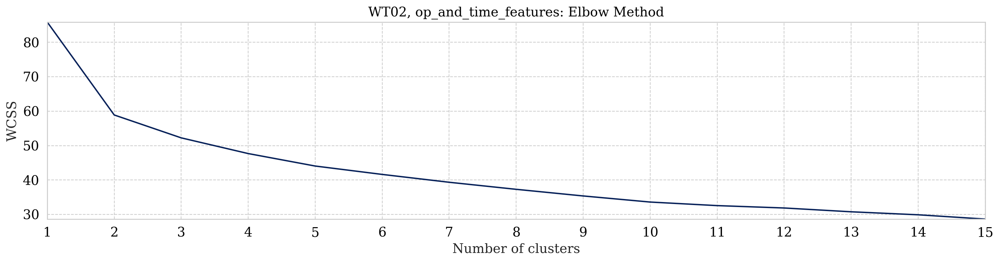

Did not replace


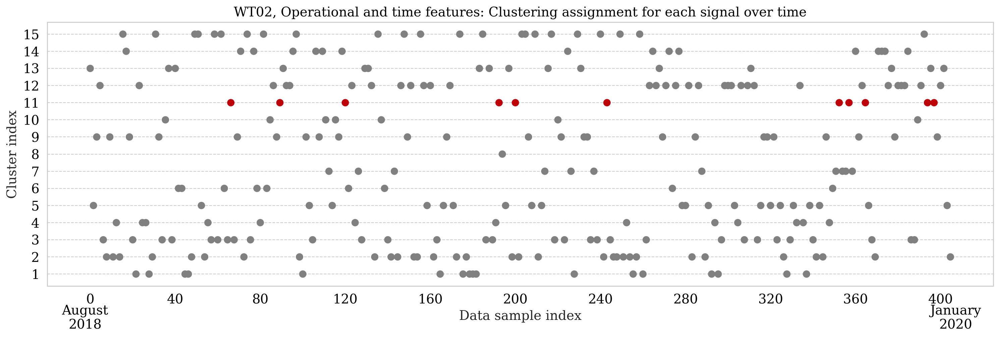

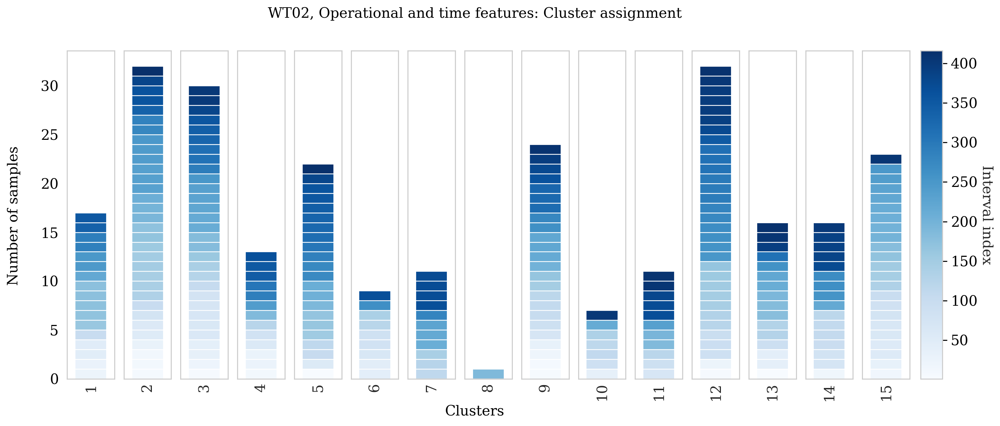

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]


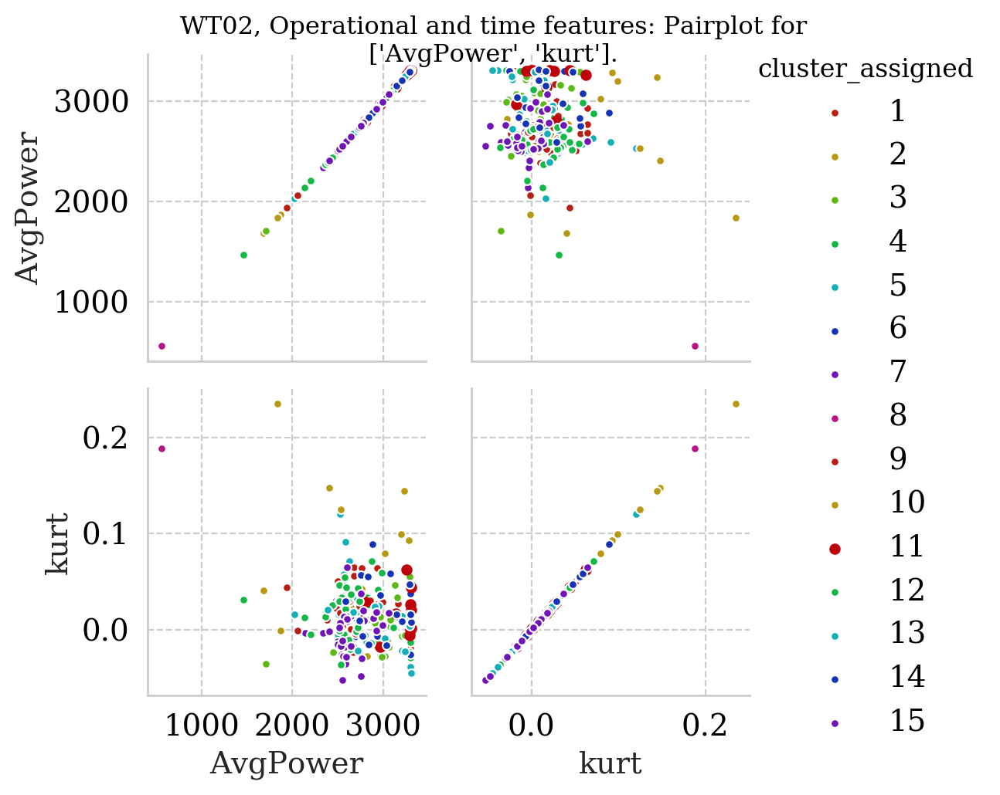

<span style="color: #2a9d8f; font-size: 20px">op_and_imf_kurtosis_features:</span>

Marker-styles not there.


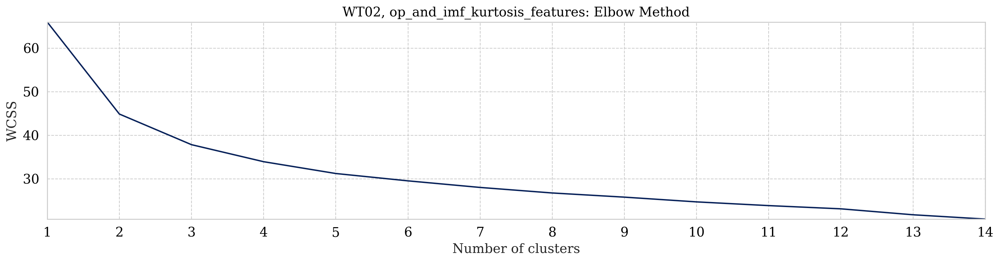

Did not replace


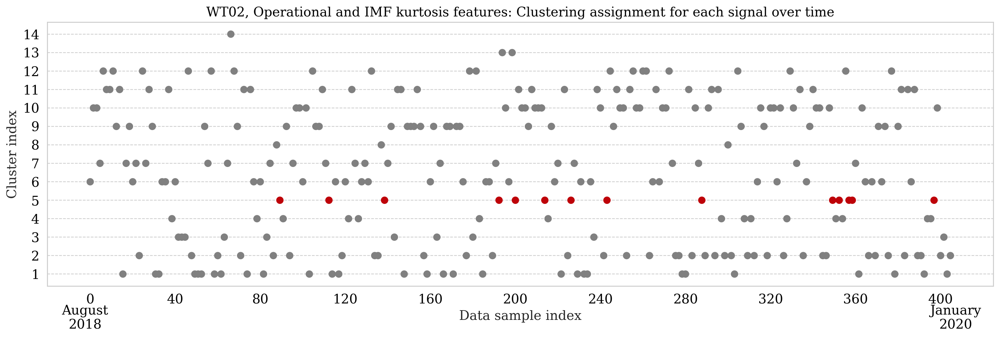

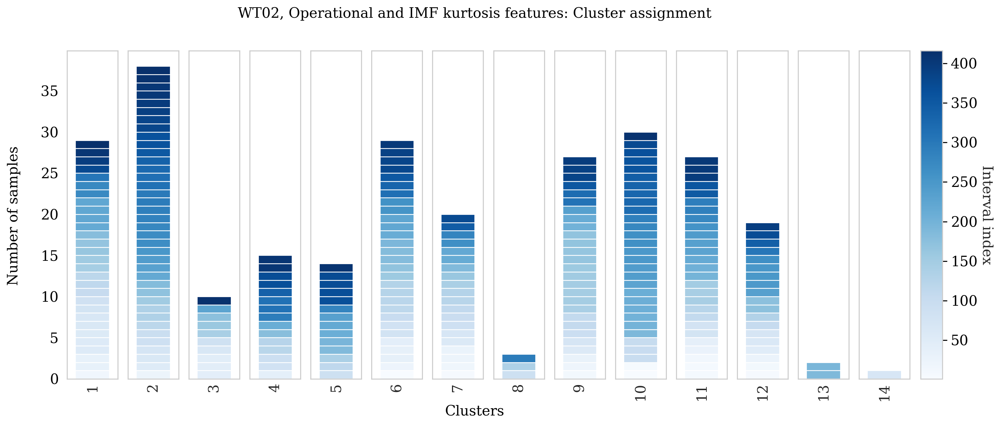

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14]


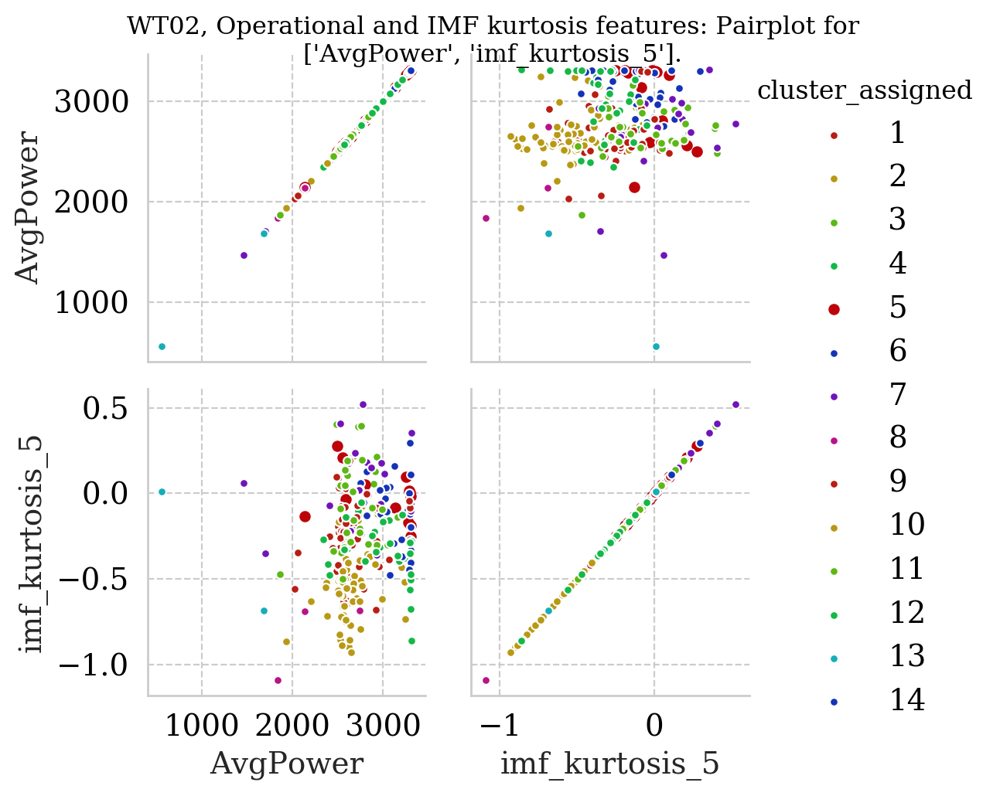

<span style="color: #2a9d8f; font-size: 20px">op_and_imf_features:</span>

Marker-styles not there.


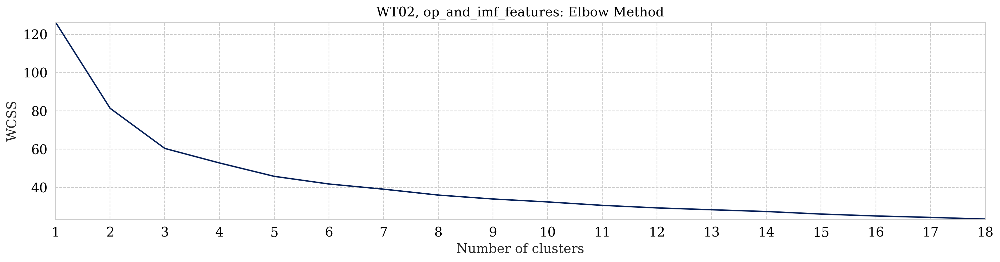

Did not replace


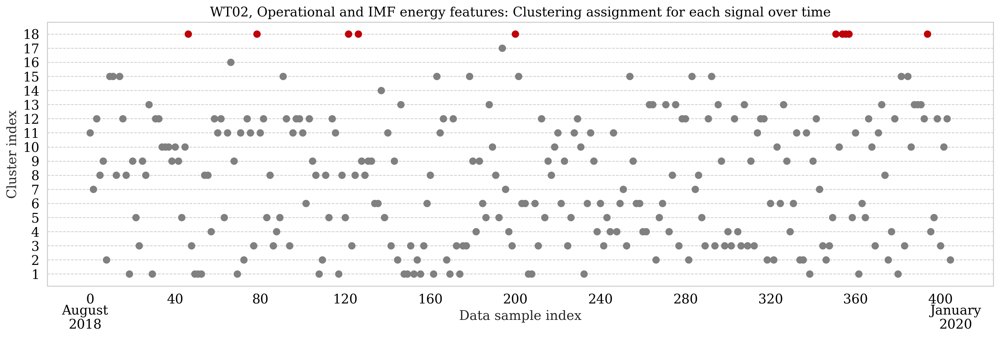

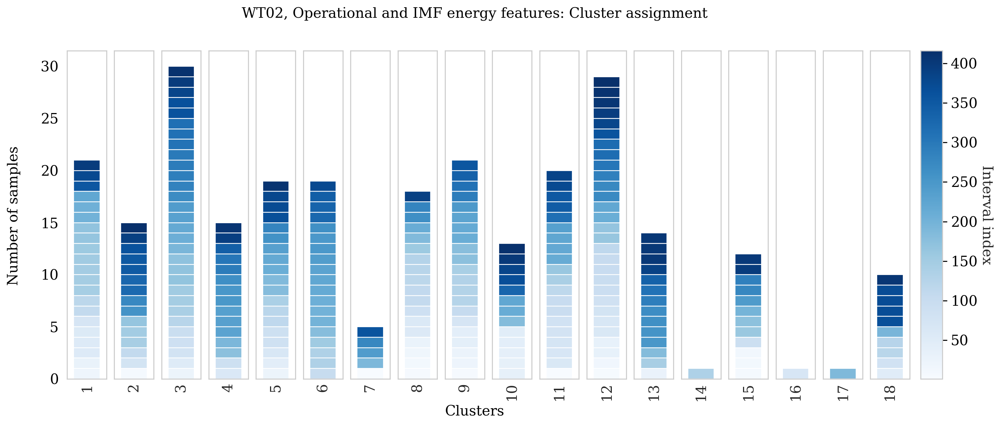

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


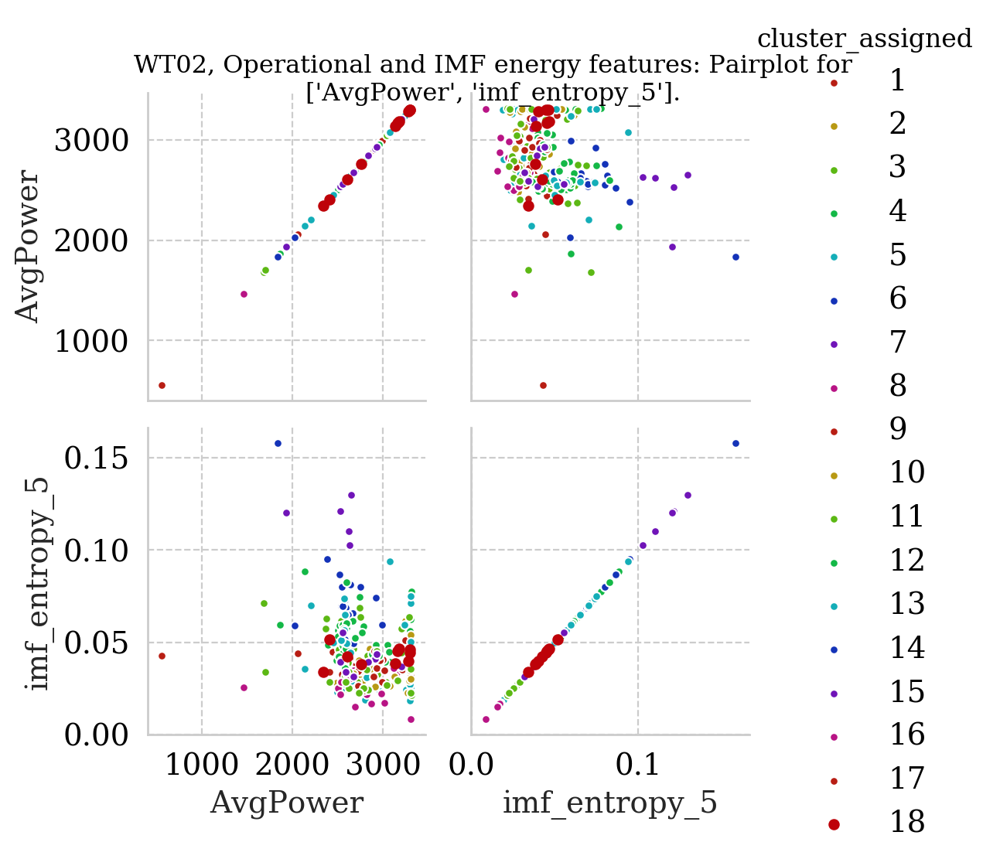

<span style="color: #2a9d8f; font-size: 20px">feature_mix:</span>

Marker-styles not there.


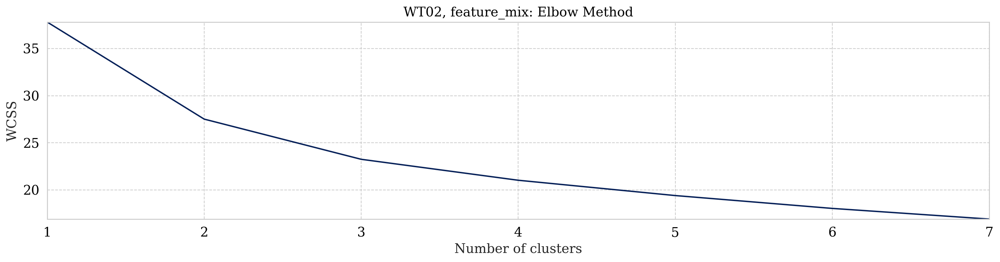

Did not replace


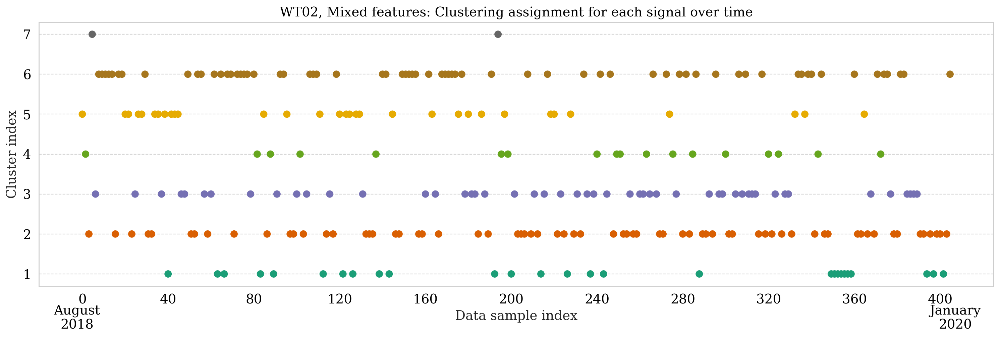

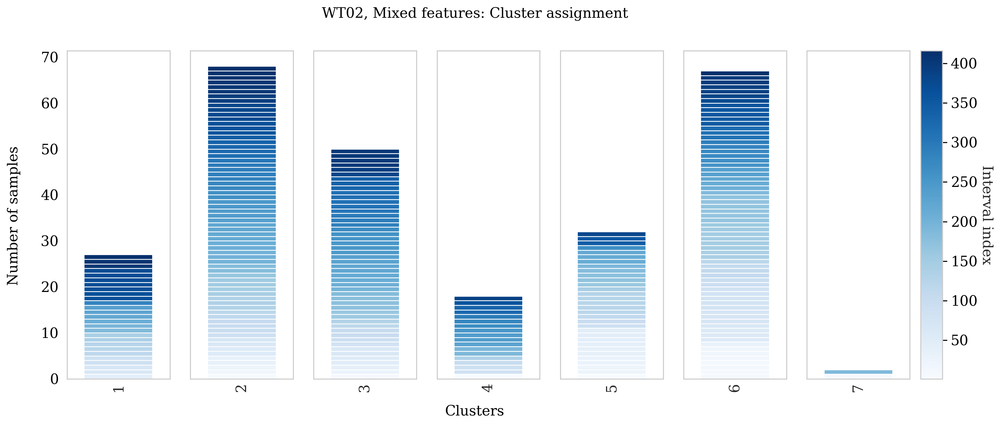

DIFFERENT HUES [1 2 3 4 5 6 7]


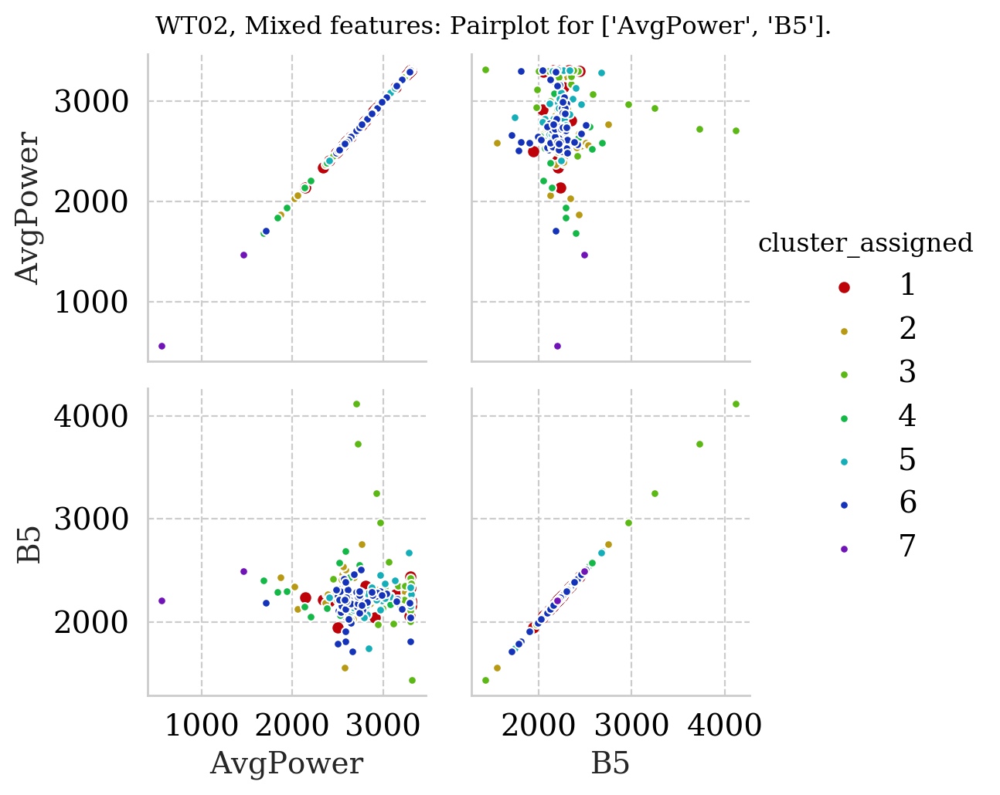

In [58]:


features_sets_titles= [
                'Operational and bi-spectrum features',
                'Operational and time features',
                'Operational and IMF kurtosis features',
                'Operational and IMF energy features',
                'Mixed features'
               ]

k_dictionary= {
    features_sets_names[0]: 11,
    features_sets_names[1]: 15,    
    features_sets_names[2]: 14,
    features_sets_names[3]: 18,
    features_sets_names[4]: 7,
}
fsets_for_printing=[
    ['AvgPower','B1'],
    ['AvgPower','kurt'],
    ['AvgPower','imf_kurtosis_5'],
    ['AvgPower','imf_entropy_5'],
    ['AvgPower','B5']]

selected_cluster_dict = {
    features_sets_names[0]: 9,
    features_sets_names[1]: 10,    
    features_sets_names[2]: 4,
    features_sets_names[3]: 17,
    features_sets_names[4]: 0,
}

print('wt_num_string:',wt_num_string)
for i,features in enumerate(features_sets):
    display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">{features_sets_names[i]}:</span>'))           
    
    assigned = run_kmeans(features_sets_titles[i],
                          wt_num_string,
                          features_sets_names[i],
                          features,
                          k_dictionary[features_sets_names[i]],
                          selected_cluster=selected_cluster_dict[features_sets_names[i]],
                          fset1=fsets_for_printing[i]
                         )

In [ ]:
print(wt_num_string)
assigned = run_kmeans('Complete data set',wt_num_string,'all_36_features',features,k_dictionary[features_sets_names[0]])


### Running through the different subsets of dataframes with dbscan

In [ ]:
import matplotlib
def plot_k_means_tuning(wt_num,df,feature_set_name):
    colormap = plt.cm.Blues
    normalize = matplotlib.colors.Normalize(vmin=-20, vmax=30)
    
    fig,ax=plt.subplots(figsize=(15,5))
    # df.plot.scatter(x='intervals_in_max_cluster',y='max_percentages',c='max_cluster_number',cmap='Blues',s=50,ax=ax)
    
    plt.scatter(df.intervals_in_max_cluster,df.max_percentages,s=100,c=df.max_cluster_number,cmap='Blues',norm=normalize)
    plt.colorbar()
    plt.clim(0,29)
    ax.set_ylabel('Percentage of intervals in cluster with Index > 350')
    ax.set_xlabel('Total number of intervals in cluster')
    ax.set_title(f'WT{wt_num}: Parameter tuning for K-means to tune number of later intervals isolated\n Feature set: {feature_set_name}')
    plt.show()

features_sets= [
                op_and_bispec_features,
                op_and_time_features,
                op_and_imf_kurtosis_features,
                op_and_imf_features
               ]

print('Features cleaned')
df=kmeans(wt_num_string,features_cleaned,30)
plot_k_means_tuning(df,'All features')

for i,features in enumerate(features_sets):
    print('*---------------------------------------------------------------*')
    print(features_sets_names[i])
    df=kmeans(features,30)
    display(df)
    plot_k_means_tuning(wt_num,df,features_sets_names[i])
    plt.show()    

In [ ]:
# How many sampels are in the last 50 intervals?
features_cleaned[features_cleaned['Index']>350].count()

In [ ]:
# Dropping the time subset.
drop_time=pd.concat([operating_features,bispectrum_features,imf_features,imf_kurt_features],axis=1)

In [ ]:
SELECTED_FEATURES=drop_time

df=kmeans(SELECTED_FEATURES,7)
display(df)
text=df.to_latex(index=True)
# plot_k_means_tuning(df,'All features except time.')
text

In [ ]:
myDict = {}
y_cluster_kmeans=cluster_labels
min_clus = y_cluster_kmeans.min()


def map_index(index,feature_df):
    result=feature_df.iloc[index,:]['Index']
    return result


if not (min_clus == 0):
    if min_clus < 0:
        y_cluster_kmeans = y_cluster_kmeans + (min_clus*-1 )    
    elif min_clus > 0:
        y_cluster_kmeans = y_cluster_kmeans - min_clus
    min_clus = 0
# Placing the clustered points in cluster lists (where the lists in each key contain indexes)
for i, elem in enumerate(y_cluster_kmeans):
    if (elem in myDict):
        myDict[elem].append(i)
    else:
        myDict[elem] = [i]

for i in range(min_clus,len(myDict)): # Sorting the dictionaries
    np.sort(myDict[i])

# MAP THEM OVER TO NORMAL INDEX!

for i in range(min_clus,len(myDict)): # map these indexes to the actual indexes in the interval.
        index_list=myDict[i]
        new_list=[]
        for j,elem in enumerate(index_list):
            new_list.append(int(map_index(elem,features_cleaned)))
        myDict[i]=new_list



print(myDict[2])
    
for i in range(len(myDict)):
    ax=sns.kdeplot(myDict[i], shade=True,);   
    ax.set_ylim(0,0.007)
    ax.set_title(f'Cluster number {i+1}')
    
    # sns.distplot(myDict[i], bins=20, kde=False, rug=True);
    #plt.show()

    

In [ ]:
def db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max,kind='raw'):
    '''
    Extract paramaters to optimize the DB scan.
    
    Args:
        SELECTED_FEATURES (pd.DataFrame): Df with ml features to cluster. Should be MinMaxScaled!
        min_samples_max (int): States the max number of intervals (points) needed to form a cluster.
        eps_range_max (int): States the max distance to neighbouring point which is included in same cluster.
    Returns:
        df (pd.DataFrame): Containing stats on the cluster with the highest amount of indexes > 350.
    '''
    min_samples_range = np.arange(5,min_samples_max)
    eps_range = np.linspace(0.3,eps_range_max,50)#100

    eps_res = []
    uniques_array = []
    min_samples_array=[] # Array with ints that state how many intervals is required to form a cluster
    intervals_in_max_cluster=[]
    max_percentages=[]
    final_df = []
    for i in tqdm(min_samples_range):
        for j,eps in enumerate(eps_range):
            cluster_labels, cluster_map = clustering.db_scan_clustering(SELECTED_FEATURES,kind,eps=eps,min_samples=i,plot=False) # Cluster the points
            clusterDict = clustering.plot_clusters(cluster_labels,SELECTED_FEATURES,False)
            cluster_stats_df=calculate_cluster_stats(clusterDict)

            # the cluster with max intervals greater that 350
            max_percentage=(cluster_stats_df['percentage_intervals_greater_than_350'].max()) 
            # Find the row with this max_percentage
            temp=cluster_stats_df[cluster_stats_df['percentage_intervals_greater_than_350']==max_percentage]


            # Extract the number of intervals in this cluster 
            interval_in_cluster = (temp['number_of_intervals_in_cluster'].max())

            eps_res.append(eps)
            min_samples_array.append(i) 
            intervals_in_max_cluster.append(interval_in_cluster)
            max_percentages.append(max_percentage)

    final_df.append(eps_res)
    final_df.append(min_samples_array)
    final_df.append(intervals_in_max_cluster)
    final_df.append(max_percentages)
    
    final_df=np.asarray(final_df)
    
    print(final_df.shape)
    final_df=pd.DataFrame(final_df.T,columns=['eps','samples_needed_to_form_cluster','intervals_in_max_cluster','max_percentages'])
    return final_df

assert features_cleaned.shape[0] == 260 # make sure noise is removed!

#SELECTED_FEATURES=features_cleaned
#eps_range_max= 1
#min_samples_max=11

#df=db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max)
#fig,ax=plt.subplots()
#df.plot.scatter(x='eps',y='samples_needed_to_form_cluster',c='max_percentages',cmap='Blues',s=50,ax=ax)
#ax.set_ylabel('samples_needed_to_form_cluster')
#ax.set_xlabel('eps')
#maximum = df['max_percentages'].max()
#rows=df[df['max_percentages']==maximum]


for i,features in enumerate(features_sets):
    print('*---------------------------------------------------------------*')
    print(features_sets_names[i])

    SELECTED_FEATURES=features
    eps_range_max= 0.7
    min_samples_max=10
    df=db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max)
    #pandas.set_option('display.max_rows', df.shape[0]+1)
    #display(df)
    display(df)
    fig,ax=plt.subplots()
    df.plot.scatter(x='samples_needed_to_form_cluster',y='eps',c='max_percentages',cmap='Blues',s=50,ax=ax)
    ax.set_ylabel('eps')
    ax.set_xlabel('samples_needed_to_form_cluster')
    ax.set_title('8 PCA components')
    plt.show()
    '''
    optimized_eps=1
    optimized_min_samples=4

    cluster_labels, cluster_map = clustering.db_scan_clustering(SELECTED_FEATURES,'raw',eps=optimized_eps,min_samples=optimized_min_samples,plot=True) # Cluster the points
    cluster_dict=clustering.plot_clusters(cluster_labels,SELECTED_FEATURES) # plot the clusters
    clustering.plot_clusters_pair_plot(features_cleaned, ['AvgSpeed','rms','B4'],cluster_labels) # pair plot 1
    clustering.plot_clusters_pair_plot(features_cleaned, ['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],cluster_labels) # pair plot 2
    df=calculate_cluster_stats(cluster_dict) 
    '''